# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

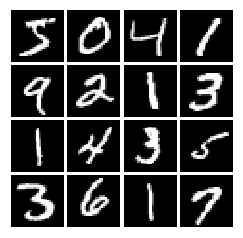

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape=(batch_size, dim), minval=-1.0, maxval=1.0)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,), activation=leaky_relu, use_bias=True),
        tf.keras.layers.Dense(256, input_shape=(256,), activation=leaky_relu, use_bias=True),
        tf.keras.layers.Dense(1, input_shape=(256,), activation=leaky_relu, use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [8]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
  

In [ ]:
      
test_discriminator()

## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [31]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation=tf.nn.relu, use_bias=True),
        tf.keras.layers.Dense(1024, input_shape=(1024,), activation=tf.nn.relu, use_bias=True),
        tf.keras.layers.Dense(784, input_shape=(1024,), activation=tf.nn.tanh, use_bias=True),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [9]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        

In [32]:
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [10]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_true = tf.ones_like(logits_real)
    fake_true = tf.zeros_like(logits_fake)
    loss = bce(real_true, logits_real) + bce(fake_true, logits_fake)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    fake_true = tf.ones_like(logits_fake)
    loss= bce(fake_true, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [37]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [38]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [17]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    #D_solver = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [12]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.407, G:0.7004


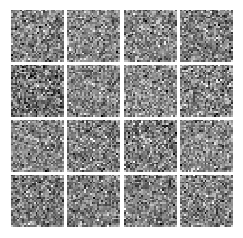

Epoch: 0, Iter: 20, D: 0.9292, G:0.7055


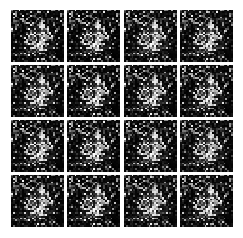

Epoch: 0, Iter: 40, D: 0.6901, G:0.7025


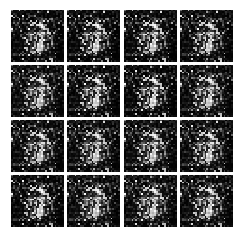

Epoch: 0, Iter: 60, D: 1.389, G:0.7265


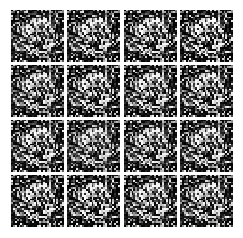

Epoch: 0, Iter: 80, D: 1.354, G:0.7481


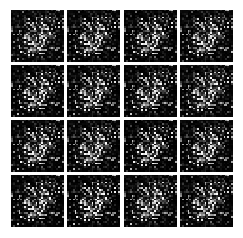

Epoch: 0, Iter: 100, D: 1.356, G:0.7405


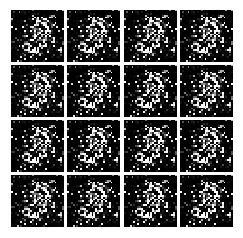

Epoch: 0, Iter: 120, D: 1.307, G:0.7153


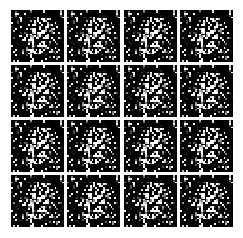

Epoch: 0, Iter: 140, D: 1.332, G:0.8071


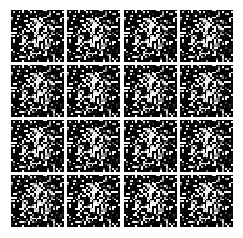

Epoch: 0, Iter: 160, D: 0.6773, G:0.7441


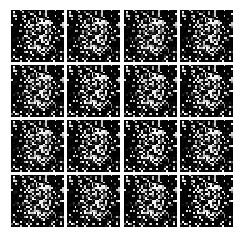

Epoch: 0, Iter: 180, D: 1.385, G:0.7283


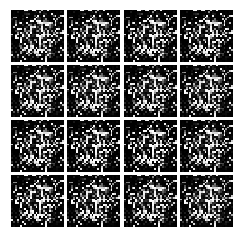

Epoch: 0, Iter: 200, D: 1.415, G:0.7468


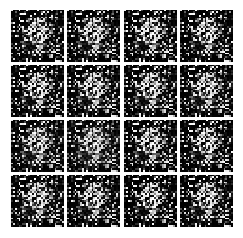

Epoch: 0, Iter: 220, D: 1.369, G:0.747


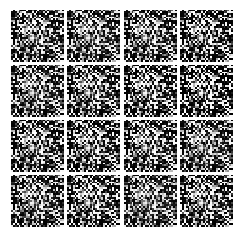

Epoch: 0, Iter: 240, D: 1.443, G:0.8078


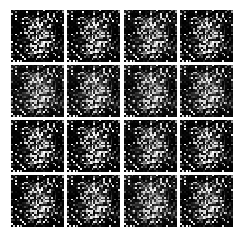

Epoch: 0, Iter: 260, D: 1.354, G:0.7621


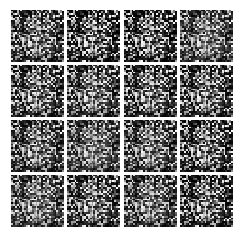

Epoch: 0, Iter: 280, D: 1.377, G:0.7379


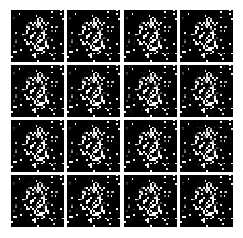

Epoch: 0, Iter: 300, D: 1.232, G:0.9773


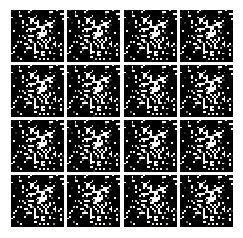

Epoch: 0, Iter: 320, D: 0.487, G:1.08


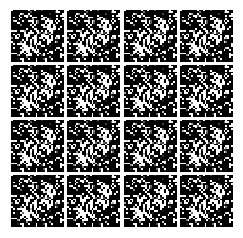

Epoch: 0, Iter: 340, D: 0.6322, G:0.7718


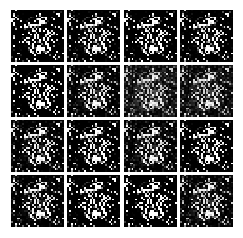

Epoch: 0, Iter: 360, D: 1.373, G:0.7804


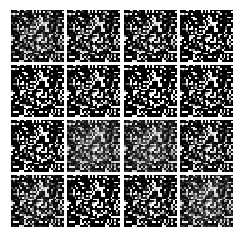

Epoch: 0, Iter: 380, D: 1.415, G:0.711


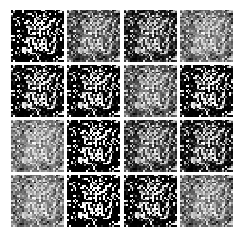

Epoch: 0, Iter: 400, D: 1.405, G:0.7142


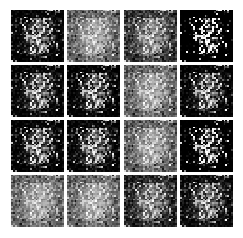

Epoch: 0, Iter: 420, D: 1.391, G:0.7217


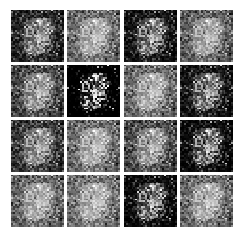

Epoch: 0, Iter: 440, D: 1.403, G:0.7056


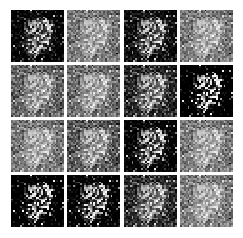

Epoch: 0, Iter: 460, D: 1.391, G:0.726


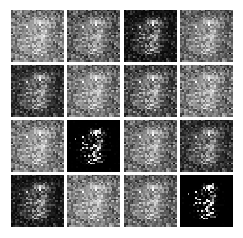

Epoch: 1, Iter: 480, D: 1.428, G:0.7198


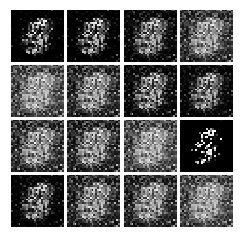

Epoch: 1, Iter: 500, D: 1.381, G:0.1662


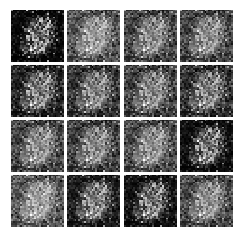

Epoch: 1, Iter: 520, D: 1.407, G:0.7101


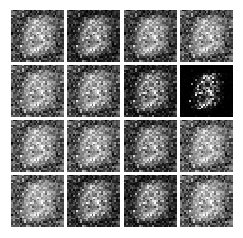

Epoch: 1, Iter: 540, D: 3.091, G:0.7218


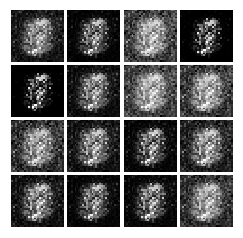

Epoch: 1, Iter: 560, D: 1.396, G:0.7069


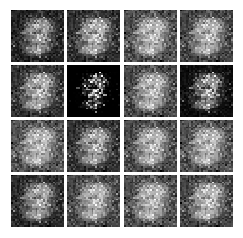

Epoch: 1, Iter: 580, D: 1.394, G:0.737


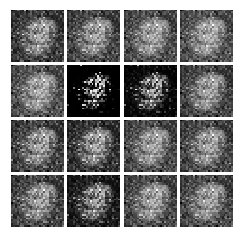

Epoch: 1, Iter: 600, D: 1.398, G:0.7088


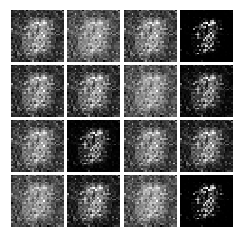

Epoch: 1, Iter: 620, D: 1.385, G:0.7053


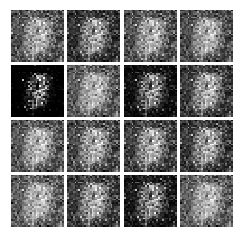

Epoch: 1, Iter: 640, D: 1.346, G:0.6963


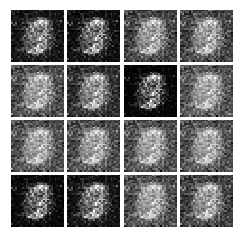

Epoch: 1, Iter: 660, D: 1.383, G:0.7389


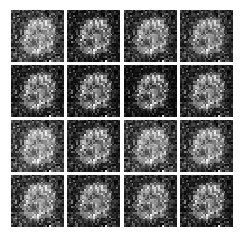

Epoch: 1, Iter: 680, D: 1.381, G:0.6973


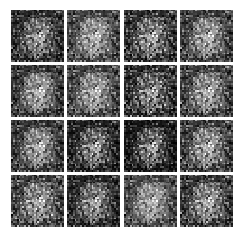

Epoch: 1, Iter: 700, D: 1.376, G:0.7025


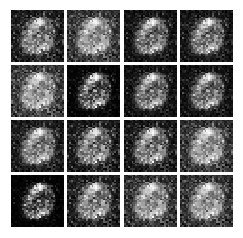

Epoch: 1, Iter: 720, D: 1.385, G:0.7977


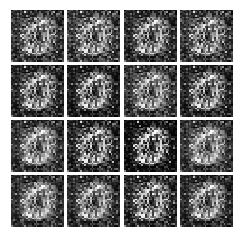

Epoch: 1, Iter: 740, D: 1.392, G:0.7142


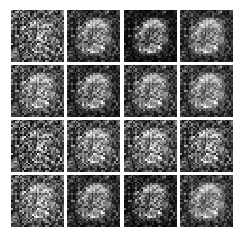

Epoch: 1, Iter: 760, D: 1.302, G:0.7126


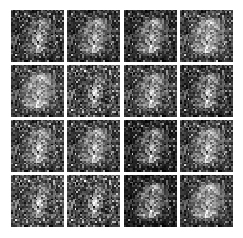

Epoch: 1, Iter: 780, D: 1.372, G:0.7745


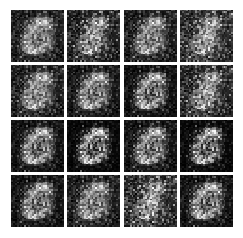

Epoch: 1, Iter: 800, D: 1.378, G:0.7195


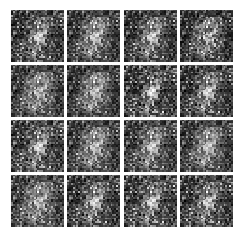

Epoch: 1, Iter: 820, D: 1.39, G:0.7106


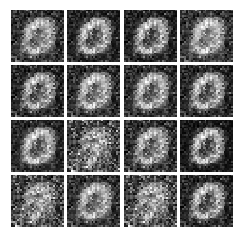

Epoch: 1, Iter: 840, D: 1.394, G:0.7149


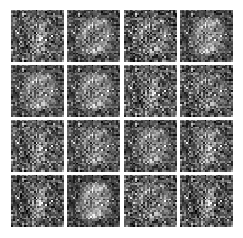

Epoch: 1, Iter: 860, D: 1.385, G:0.7155


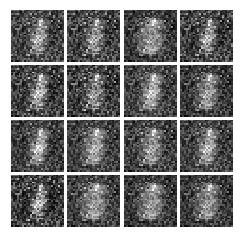

Epoch: 1, Iter: 880, D: 1.405, G:0.7258


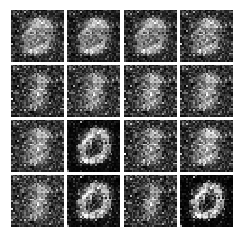

Epoch: 1, Iter: 900, D: 1.387, G:0.7356


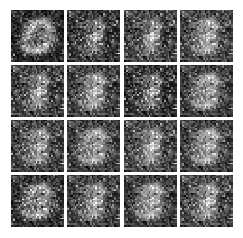

Epoch: 1, Iter: 920, D: 1.391, G:0.7182


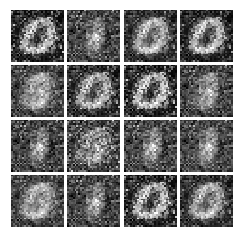

Epoch: 2, Iter: 940, D: 1.388, G:0.6988


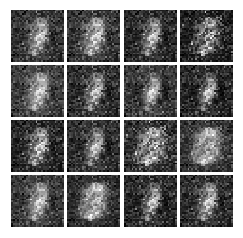

Epoch: 2, Iter: 960, D: 1.392, G:0.7154


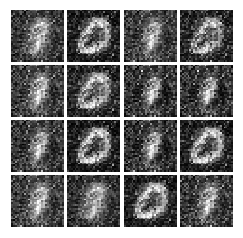

Epoch: 2, Iter: 980, D: 1.389, G:0.7099


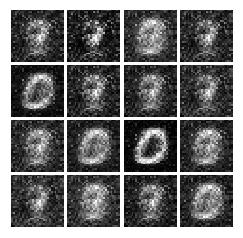

Epoch: 2, Iter: 1000, D: 1.38, G:0.7548


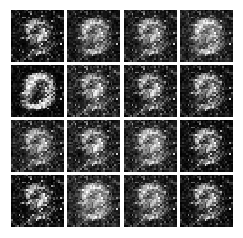

Epoch: 2, Iter: 1020, D: 1.382, G:0.7475


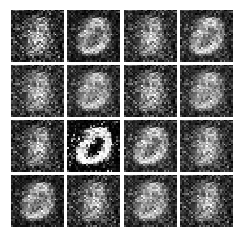

Epoch: 2, Iter: 1040, D: 1.375, G:0.7229


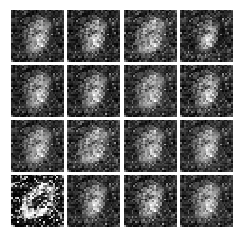

Epoch: 2, Iter: 1060, D: 1.38, G:0.7351


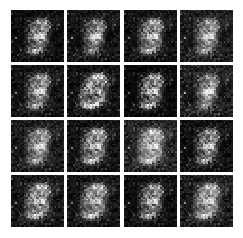

Epoch: 2, Iter: 1080, D: 1.394, G:0.7901


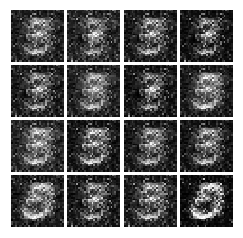

Epoch: 2, Iter: 1100, D: 1.379, G:0.7434


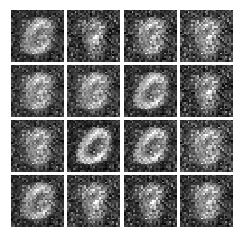

Epoch: 2, Iter: 1120, D: 1.361, G:0.8241


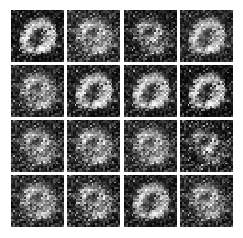

Epoch: 2, Iter: 1140, D: 1.354, G:0.3205


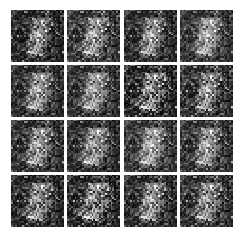

Epoch: 2, Iter: 1160, D: 1.402, G:0.7739


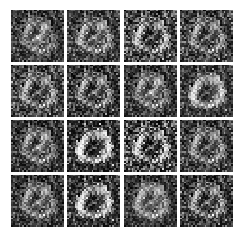

Epoch: 2, Iter: 1180, D: 1.388, G:0.7176


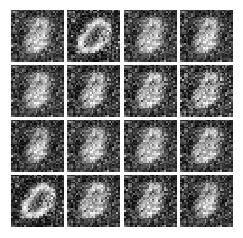

Epoch: 2, Iter: 1200, D: 1.374, G:0.7555


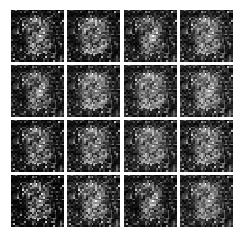

Epoch: 2, Iter: 1220, D: 1.386, G:0.7367


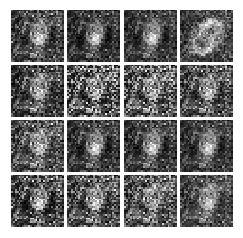

Epoch: 2, Iter: 1240, D: 1.341, G:0.7082


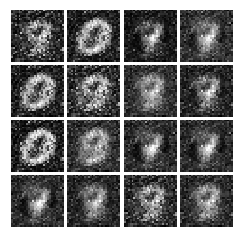

Epoch: 2, Iter: 1260, D: 1.392, G:0.7691


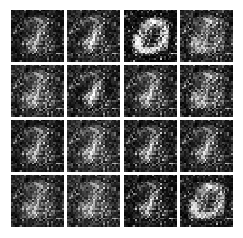

Epoch: 2, Iter: 1280, D: 1.25, G:0.03568


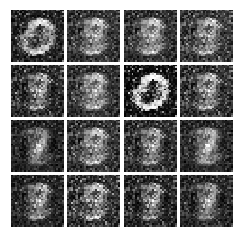

Epoch: 2, Iter: 1300, D: 1.372, G:0.7657


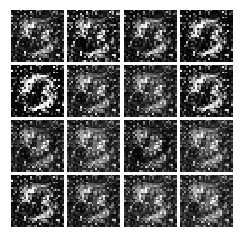

Epoch: 2, Iter: 1320, D: 1.39, G:0.7085


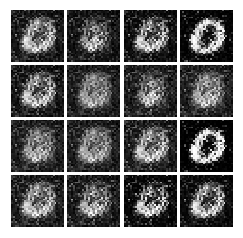

Epoch: 2, Iter: 1340, D: 1.407, G:0.7192


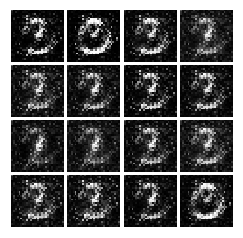

Epoch: 2, Iter: 1360, D: 1.358, G:0.8893


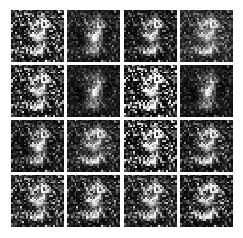

Epoch: 2, Iter: 1380, D: 1.338, G:0.7019


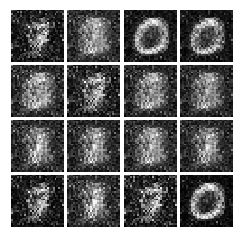

Epoch: 2, Iter: 1400, D: 1.373, G:0.8448


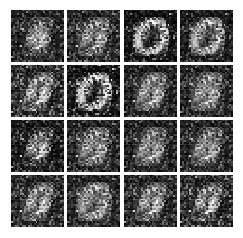

Epoch: 3, Iter: 1420, D: 1.23, G:0.2329


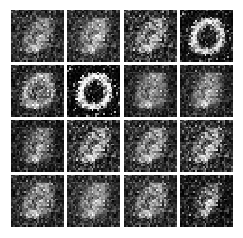

Epoch: 3, Iter: 1440, D: 1.475, G:0.8493


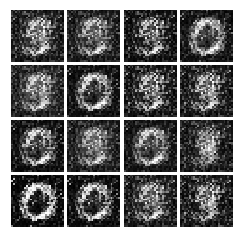

Epoch: 3, Iter: 1460, D: 1.395, G:0.7258


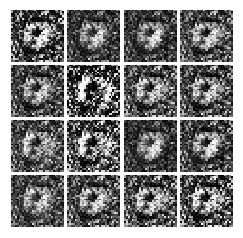

Epoch: 3, Iter: 1480, D: 1.301, G:0.716


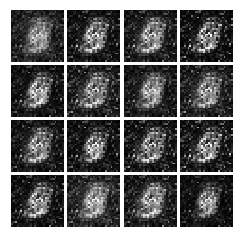

Epoch: 3, Iter: 1500, D: 1.365, G:0.9486


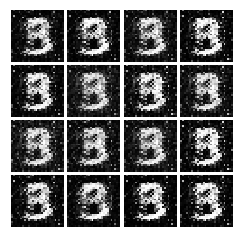

Epoch: 3, Iter: 1520, D: 1.396, G:0.7204


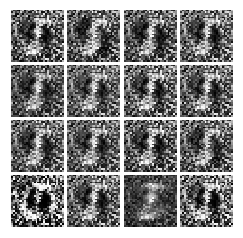

Epoch: 3, Iter: 1540, D: 1.4, G:0.705


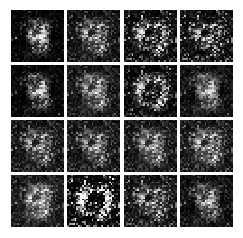

Epoch: 3, Iter: 1560, D: 1.374, G:0.8551


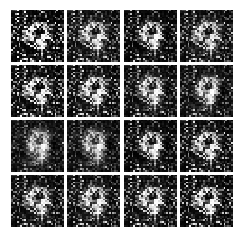

Epoch: 3, Iter: 1580, D: 1.375, G:0.8112


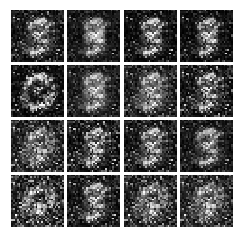

Epoch: 3, Iter: 1600, D: 2.074, G:0.8409


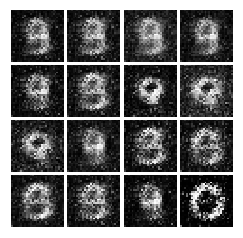

Epoch: 3, Iter: 1620, D: 1.375, G:0.755


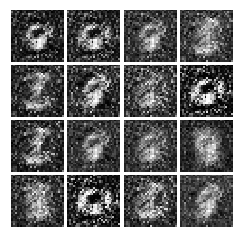

Epoch: 3, Iter: 1640, D: 1.33, G:0.9112


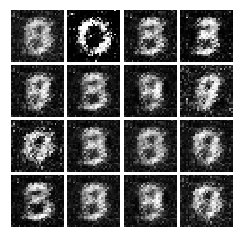

Epoch: 3, Iter: 1660, D: 1.326, G:0.6918


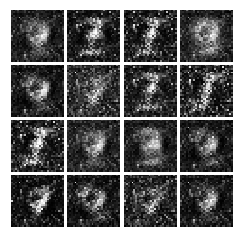

Epoch: 3, Iter: 1680, D: 1.367, G:0.7517


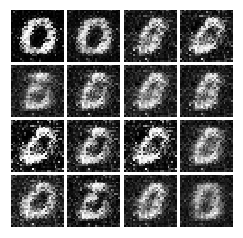

Epoch: 3, Iter: 1700, D: 1.402, G:0.7082


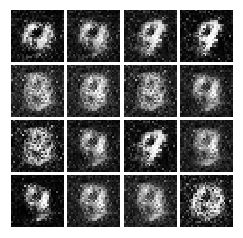

Epoch: 3, Iter: 1720, D: 1.407, G:0.7988


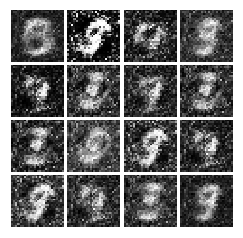

Epoch: 3, Iter: 1740, D: 1.398, G:0.7139


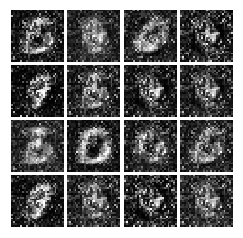

Epoch: 3, Iter: 1760, D: 1.382, G:0.7188


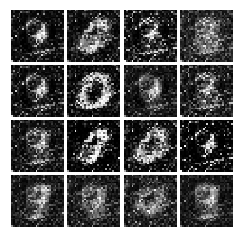

Epoch: 3, Iter: 1780, D: 1.402, G:0.7357


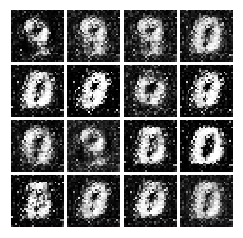

Epoch: 3, Iter: 1800, D: 1.368, G:0.8402


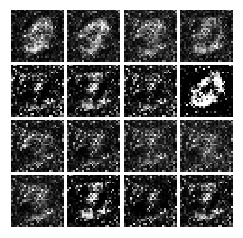

Epoch: 3, Iter: 1820, D: 1.356, G:0.7227


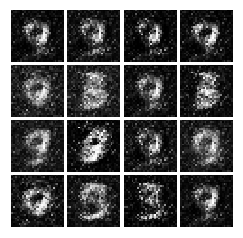

Epoch: 3, Iter: 1840, D: 1.392, G:0.709


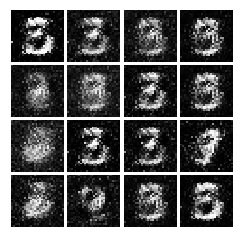

Epoch: 3, Iter: 1860, D: 1.377, G:0.8178


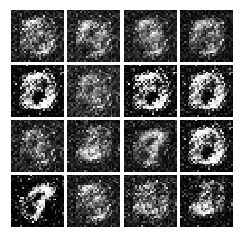

Epoch: 4, Iter: 1880, D: 1.418, G:0.7726


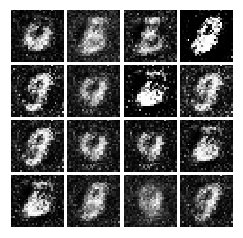

Epoch: 4, Iter: 1900, D: 1.36, G:0.8889


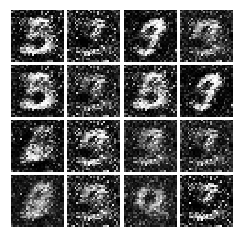

Epoch: 4, Iter: 1920, D: 1.395, G:0.7705


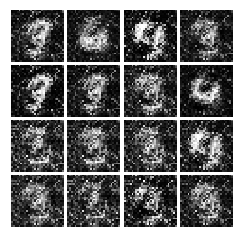

Epoch: 4, Iter: 1940, D: 1.366, G:0.692


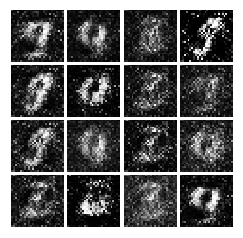

Epoch: 4, Iter: 1960, D: 1.353, G:0.8047


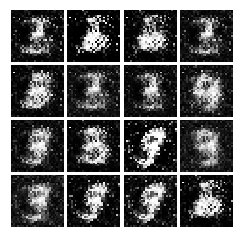

Epoch: 4, Iter: 1980, D: 1.419, G:0.7226


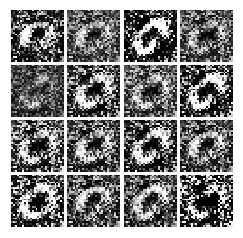

Epoch: 4, Iter: 2000, D: 1.44, G:0.7092


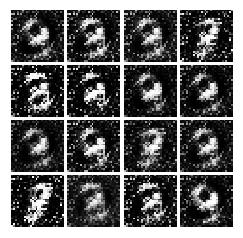

Epoch: 4, Iter: 2020, D: 1.397, G:0.8116


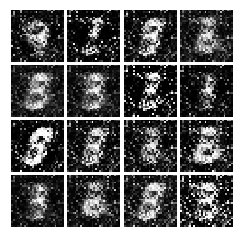

Epoch: 4, Iter: 2040, D: 1.321, G:1.024


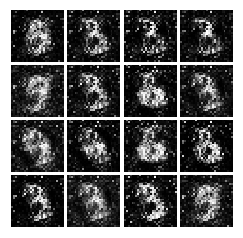

Epoch: 4, Iter: 2060, D: 1.394, G:0.7506


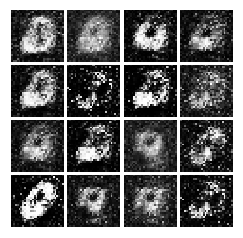

Epoch: 4, Iter: 2080, D: 1.366, G:1.019


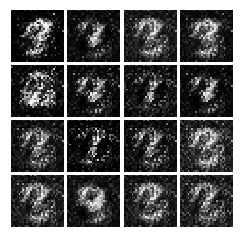

Epoch: 4, Iter: 2100, D: 1.387, G:0.7384


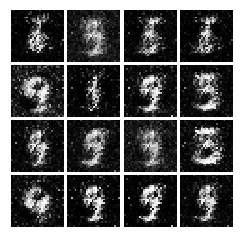

Epoch: 4, Iter: 2120, D: 1.396, G:0.7158


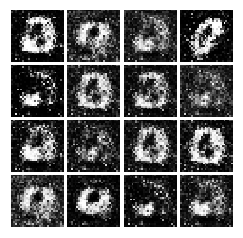

Epoch: 4, Iter: 2140, D: 1.376, G:0.8603


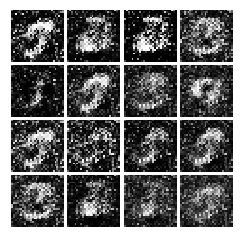

Epoch: 4, Iter: 2160, D: 1.377, G:0.7996


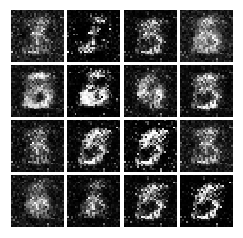

Epoch: 4, Iter: 2180, D: 1.418, G:0.7467


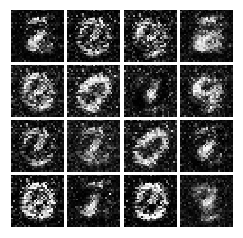

Epoch: 4, Iter: 2200, D: 1.373, G:0.8241


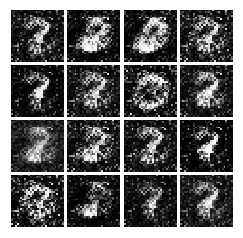

Epoch: 4, Iter: 2220, D: 1.383, G:0.7539


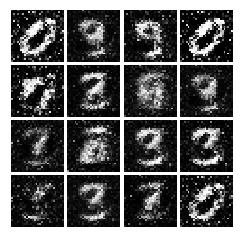

Epoch: 4, Iter: 2240, D: 1.359, G:0.6792


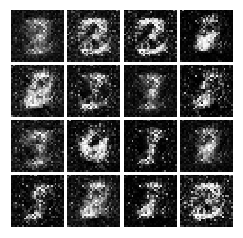

Epoch: 4, Iter: 2260, D: 1.382, G:0.77


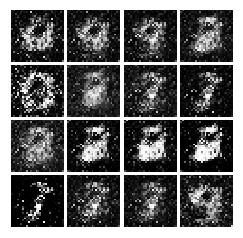

Epoch: 4, Iter: 2280, D: 1.377, G:0.7981


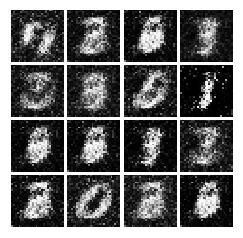

Epoch: 4, Iter: 2300, D: 1.394, G:0.72


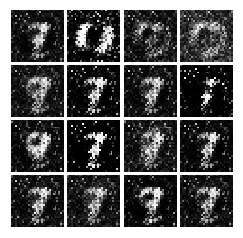

Epoch: 4, Iter: 2320, D: 1.349, G:0.851


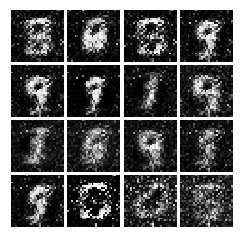

Epoch: 4, Iter: 2340, D: 1.352, G:0.8878


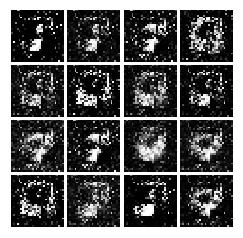

Epoch: 5, Iter: 2360, D: 1.365, G:0.8739


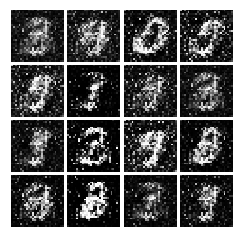

Epoch: 5, Iter: 2380, D: 1.367, G:0.7161


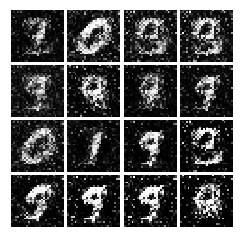

Epoch: 5, Iter: 2400, D: 1.343, G:0.7429


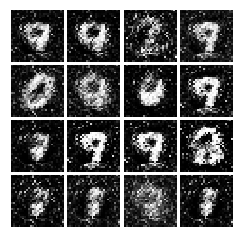

Epoch: 5, Iter: 2420, D: 1.404, G:0.7318


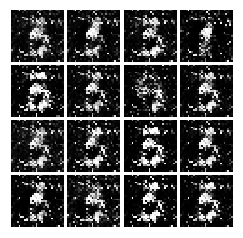

Epoch: 5, Iter: 2440, D: 1.397, G:0.7211


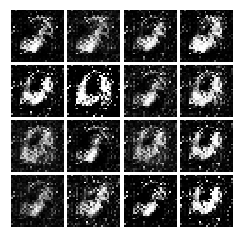

Epoch: 5, Iter: 2460, D: 1.176, G:0.3161


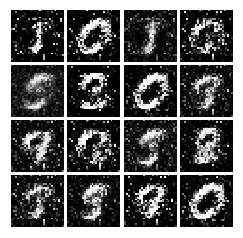

Epoch: 5, Iter: 2480, D: 1.369, G:0.9255


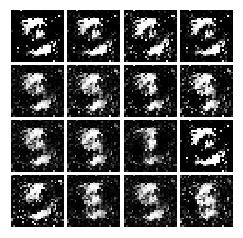

Epoch: 5, Iter: 2500, D: 1.44, G:0.7386


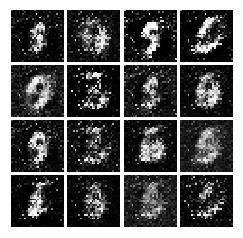

Epoch: 5, Iter: 2520, D: 1.4, G:0.7385


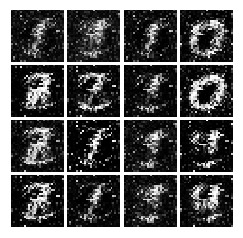

Epoch: 5, Iter: 2540, D: 1.408, G:0.7467


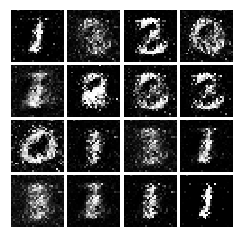

Epoch: 5, Iter: 2560, D: 1.387, G:0.7988


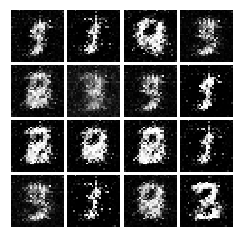

Epoch: 5, Iter: 2580, D: 1.385, G:0.736


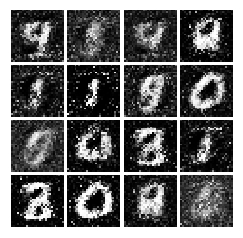

Epoch: 5, Iter: 2600, D: 1.393, G:0.7223


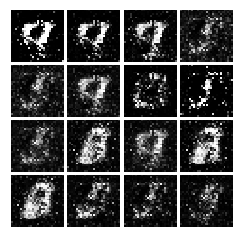

Epoch: 5, Iter: 2620, D: 1.374, G:0.7299


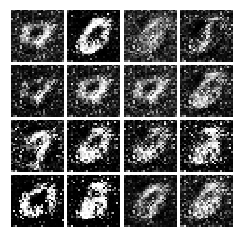

Epoch: 5, Iter: 2640, D: 1.399, G:0.7118


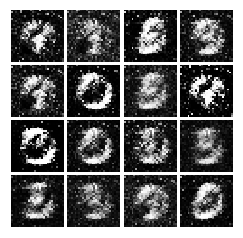

Epoch: 5, Iter: 2660, D: 1.404, G:0.8779


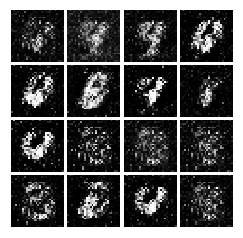

Epoch: 5, Iter: 2680, D: 1.395, G:0.7168


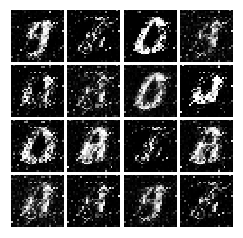

Epoch: 5, Iter: 2700, D: 1.372, G:0.907


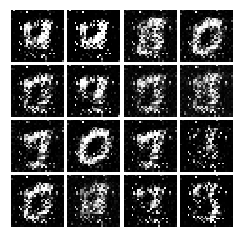

Epoch: 5, Iter: 2720, D: 1.367, G:0.8577


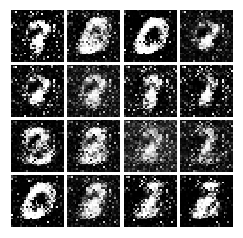

Epoch: 5, Iter: 2740, D: 3.225, G:1.21


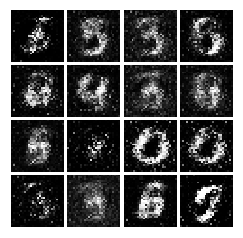

Epoch: 5, Iter: 2760, D: 1.39, G:0.7454


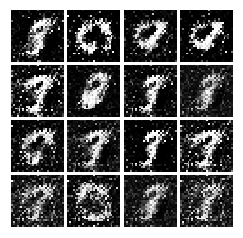

Epoch: 5, Iter: 2780, D: 1.383, G:0.7734


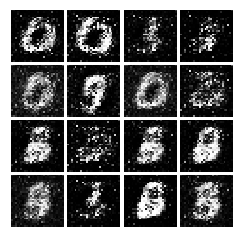

Epoch: 5, Iter: 2800, D: 1.374, G:0.9248


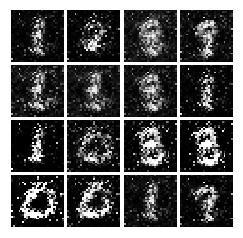

Epoch: 6, Iter: 2820, D: 1.37, G:0.7794


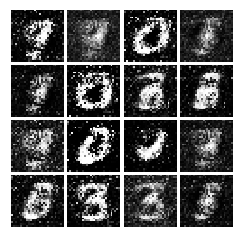

Epoch: 6, Iter: 2840, D: 1.369, G:0.9437


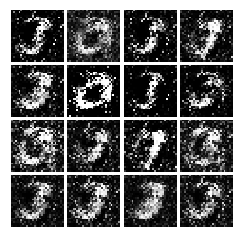

Epoch: 6, Iter: 2860, D: 1.378, G:0.8272


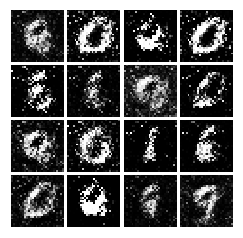

Epoch: 6, Iter: 2880, D: 4.817, G:1.1


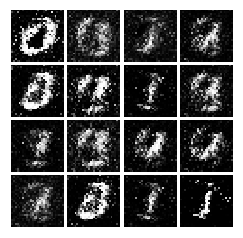

Epoch: 6, Iter: 2900, D: 1.387, G:0.7249


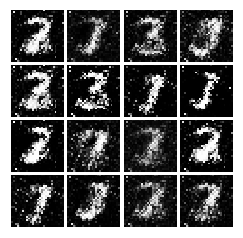

Epoch: 6, Iter: 2920, D: 2.505, G:1.028


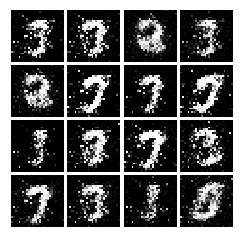

Epoch: 6, Iter: 2940, D: 1.378, G:0.8915


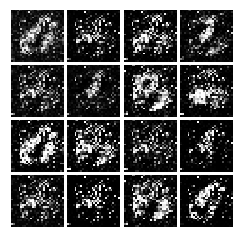

Epoch: 6, Iter: 2960, D: 1.366, G:0.8097


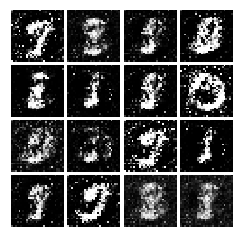

Epoch: 6, Iter: 2980, D: 1.459, G:0.7714


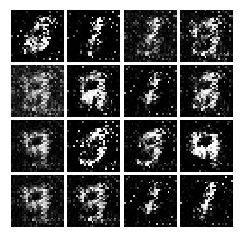

Epoch: 6, Iter: 3000, D: 1.369, G:0.805


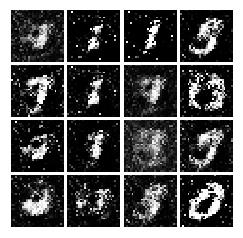

Epoch: 6, Iter: 3020, D: 1.394, G:0.7423


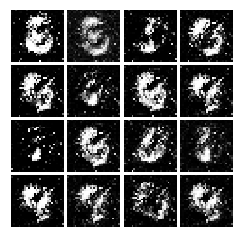

Epoch: 6, Iter: 3040, D: 1.428, G:0.8757


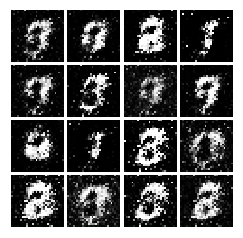

Epoch: 6, Iter: 3060, D: 1.385, G:0.784


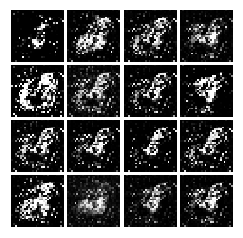

Epoch: 6, Iter: 3080, D: 1.4, G:0.8009


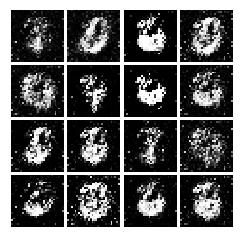

Epoch: 6, Iter: 3100, D: 1.375, G:0.8099


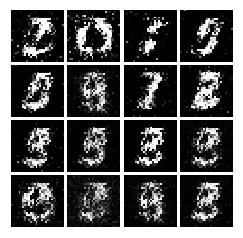

Epoch: 6, Iter: 3120, D: 1.372, G:0.7877


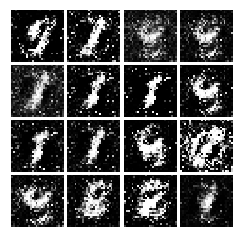

Epoch: 6, Iter: 3140, D: 1.524, G:0.8881


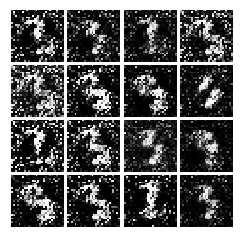

Epoch: 6, Iter: 3160, D: 1.329, G:1.13


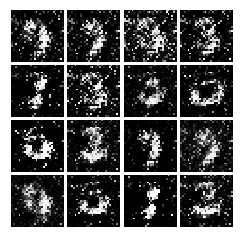

Epoch: 6, Iter: 3180, D: 1.337, G:0.9374


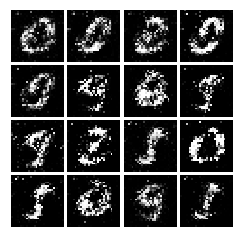

Epoch: 6, Iter: 3200, D: 1.398, G:0.7661


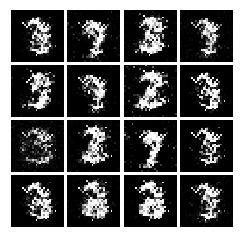

Epoch: 6, Iter: 3220, D: 1.295, G:1.144


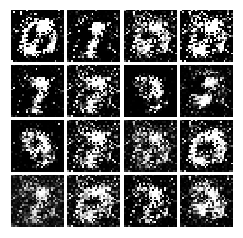

Epoch: 6, Iter: 3240, D: 1.379, G:0.7765


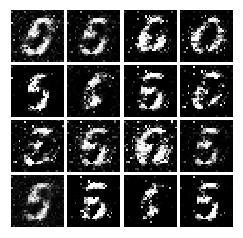

Epoch: 6, Iter: 3260, D: 1.375, G:0.9231


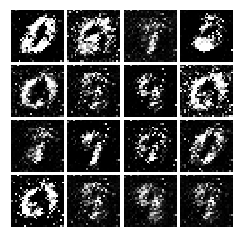

Epoch: 6, Iter: 3280, D: 1.377, G:0.7706


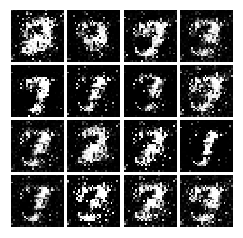

Epoch: 7, Iter: 3300, D: 1.341, G:0.8123


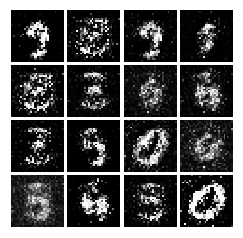

Epoch: 7, Iter: 3320, D: 1.436, G:0.7137


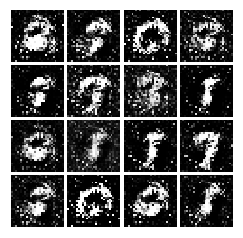

Epoch: 7, Iter: 3340, D: 1.345, G:0.7904


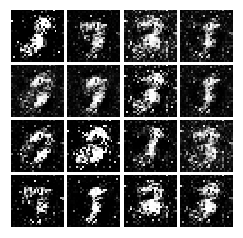

Epoch: 7, Iter: 3360, D: 1.363, G:0.7176


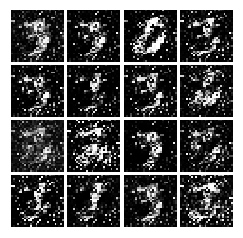

Epoch: 7, Iter: 3380, D: 1.386, G:0.775


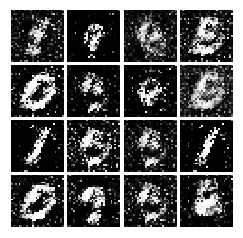

Epoch: 7, Iter: 3400, D: 1.353, G:0.7224


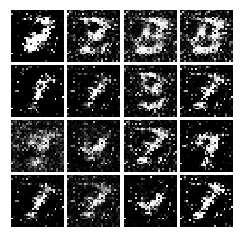

Epoch: 7, Iter: 3420, D: 1.406, G:0.775


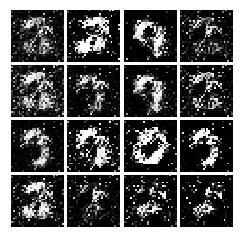

Epoch: 7, Iter: 3440, D: 1.324, G:0.7231


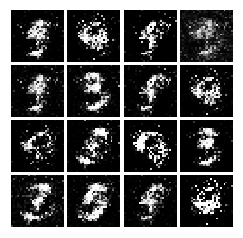

Epoch: 7, Iter: 3460, D: 1.387, G:0.7914


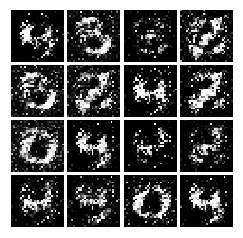

Epoch: 7, Iter: 3480, D: 1.325, G:0.8832


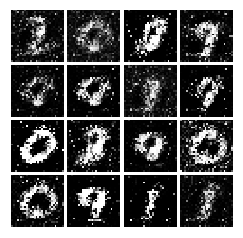

Epoch: 7, Iter: 3500, D: 1.384, G:0.8197


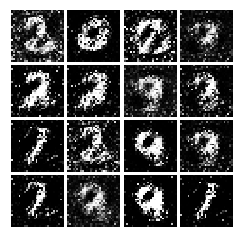

Epoch: 7, Iter: 3520, D: 1.39, G:0.7685


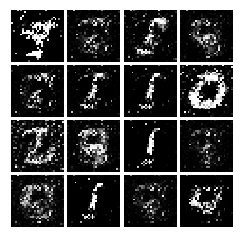

Epoch: 7, Iter: 3540, D: 1.394, G:0.7228


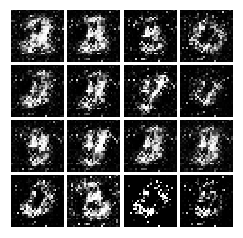

Epoch: 7, Iter: 3560, D: 1.383, G:0.7438


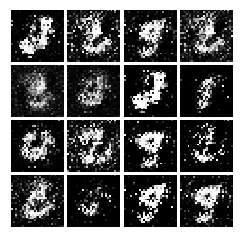

Epoch: 7, Iter: 3580, D: 5.09, G:1.252


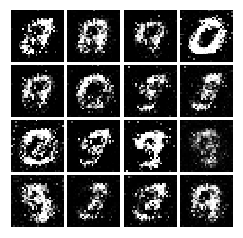

Epoch: 7, Iter: 3600, D: 1.387, G:0.738


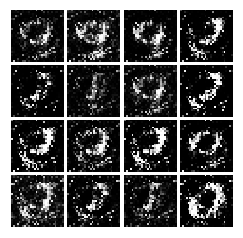

Epoch: 7, Iter: 3620, D: 1.358, G:0.9021


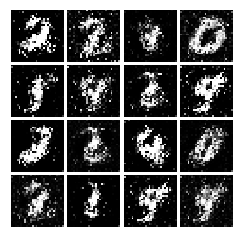

Epoch: 7, Iter: 3640, D: 1.377, G:0.7627


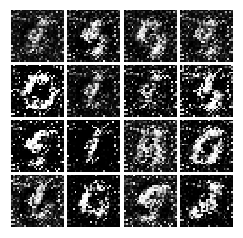

Epoch: 7, Iter: 3660, D: 1.392, G:0.7737


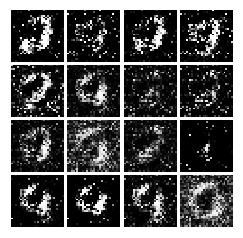

Epoch: 7, Iter: 3680, D: 1.341, G:1.112


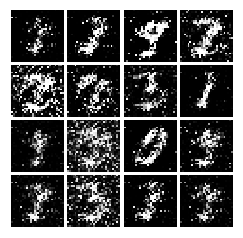

Epoch: 7, Iter: 3700, D: 1.387, G:0.7161


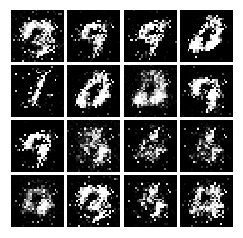

Epoch: 7, Iter: 3720, D: 2.016, G:1.87


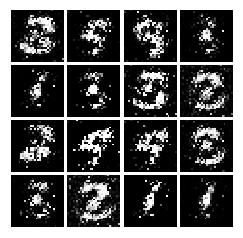

Epoch: 7, Iter: 3740, D: 1.323, G:1.146


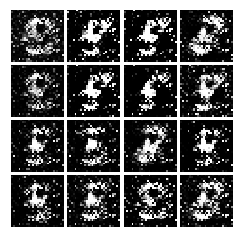

Epoch: 8, Iter: 3760, D: 1.35, G:0.6954


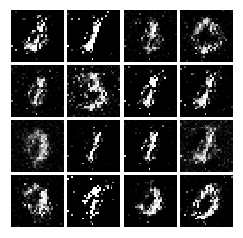

Epoch: 8, Iter: 3780, D: 1.34, G:1.058


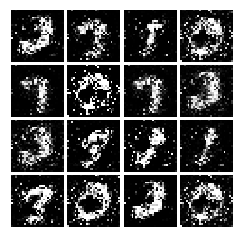

Epoch: 8, Iter: 3800, D: 1.374, G:0.8368


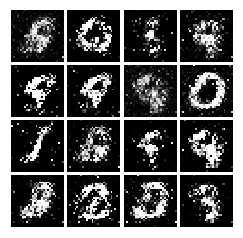

Epoch: 8, Iter: 3820, D: 1.385, G:0.8168


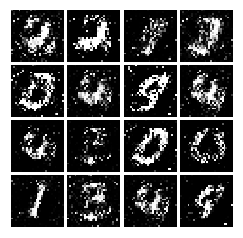

Epoch: 8, Iter: 3840, D: 1.399, G:0.7078


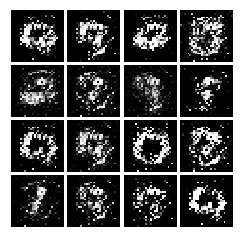

Epoch: 8, Iter: 3860, D: 1.381, G:0.7891


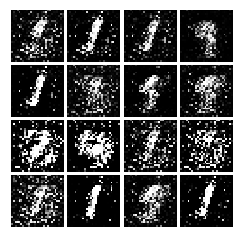

Epoch: 8, Iter: 3880, D: 1.386, G:0.7224


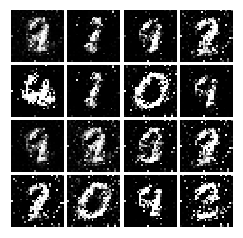

Epoch: 8, Iter: 3900, D: 1.276, G:0.9922


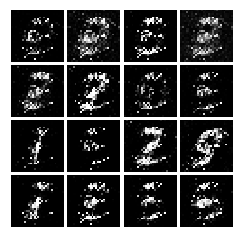

Epoch: 8, Iter: 3920, D: 1.402, G:0.7359


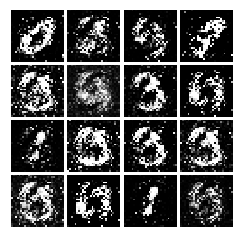

Epoch: 8, Iter: 3940, D: 1.384, G:0.7389


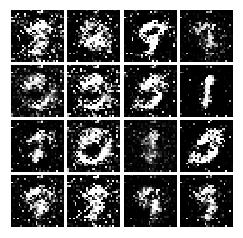

Epoch: 8, Iter: 3960, D: 1.395, G:0.7168


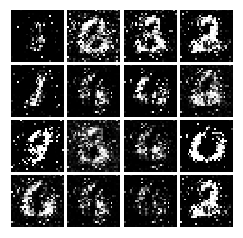

Epoch: 8, Iter: 3980, D: 1.38, G:0.7222


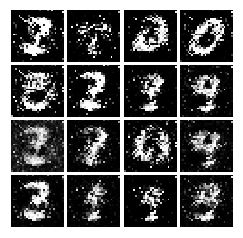

Epoch: 8, Iter: 4000, D: 1.366, G:0.8679


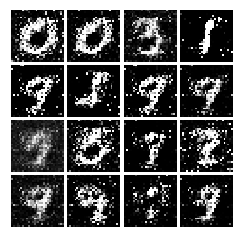

Epoch: 8, Iter: 4020, D: 1.312, G:0.849


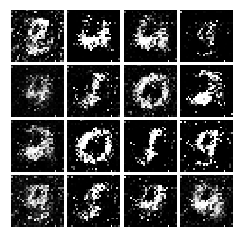

Epoch: 8, Iter: 4040, D: 1.399, G:0.7192


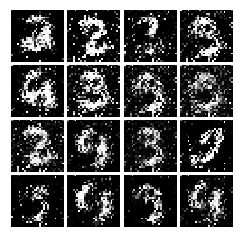

Epoch: 8, Iter: 4060, D: 1.385, G:0.7855


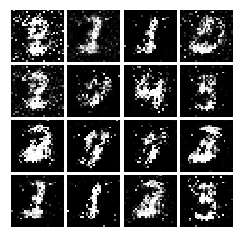

Epoch: 8, Iter: 4080, D: 1.377, G:0.7867


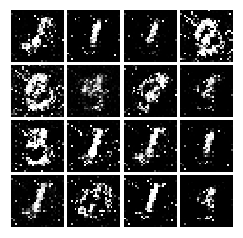

Epoch: 8, Iter: 4100, D: 1.349, G:1.065


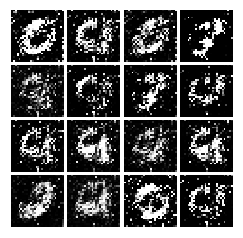

Epoch: 8, Iter: 4120, D: 1.398, G:0.7222


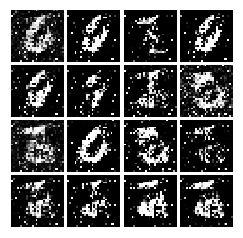

Epoch: 8, Iter: 4140, D: 1.419, G:0.9987


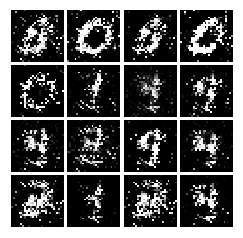

Epoch: 8, Iter: 4160, D: 1.348, G:0.9187


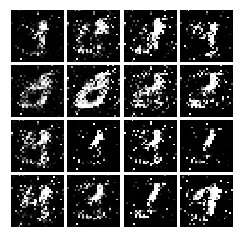

Epoch: 8, Iter: 4180, D: 1.384, G:0.7295


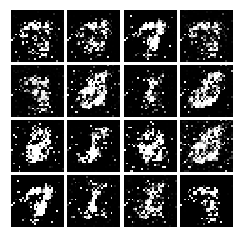

Epoch: 8, Iter: 4200, D: 1.371, G:0.868


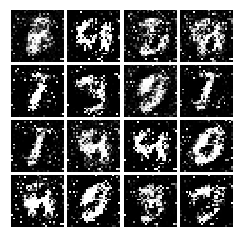

Epoch: 8, Iter: 4220, D: 1.337, G:1.113


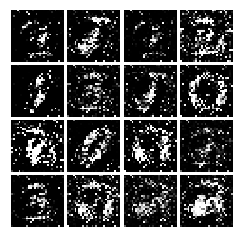

Epoch: 9, Iter: 4240, D: 1.369, G:0.7416


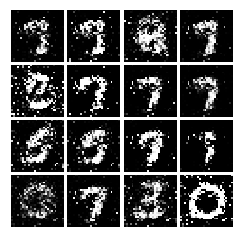

Epoch: 9, Iter: 4260, D: 1.406, G:0.7509


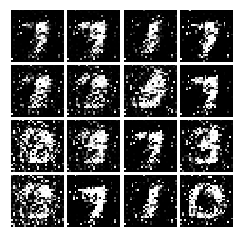

Epoch: 9, Iter: 4280, D: 1.328, G:0.9938


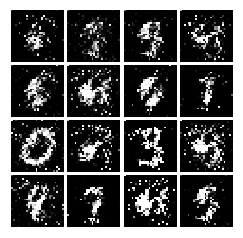

Epoch: 9, Iter: 4300, D: 1.392, G:0.7298


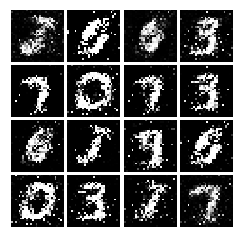

Epoch: 9, Iter: 4320, D: 1.368, G:0.8141


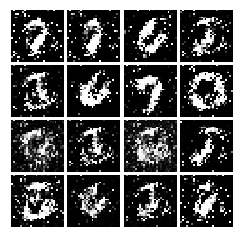

Epoch: 9, Iter: 4340, D: 1.342, G:0.8856


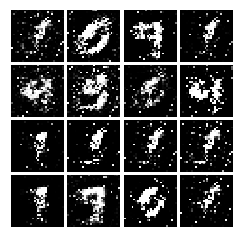

Epoch: 9, Iter: 4360, D: 1.38, G:0.8127


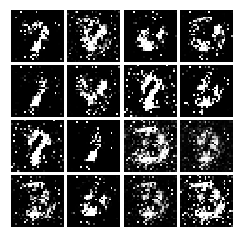

Epoch: 9, Iter: 4380, D: 1.356, G:0.9021


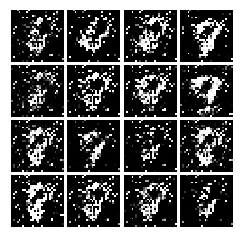

Epoch: 9, Iter: 4400, D: 3.559, G:0.7716


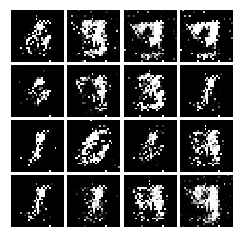

Epoch: 9, Iter: 4420, D: 1.307, G:1.047


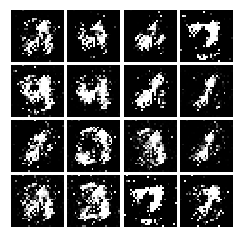

Epoch: 9, Iter: 4440, D: 3.513, G:1.229


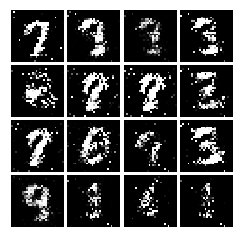

Epoch: 9, Iter: 4460, D: 1.377, G:0.7946


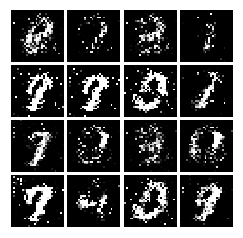

Epoch: 9, Iter: 4480, D: 2.436, G:1.969


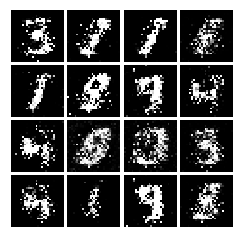

Epoch: 9, Iter: 4500, D: 1.379, G:0.745


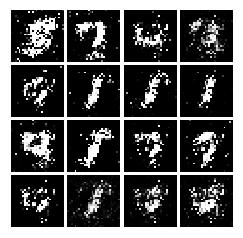

Epoch: 9, Iter: 4520, D: 1.35, G:0.9209


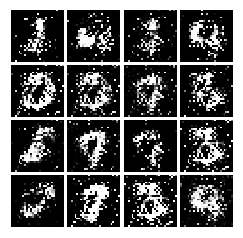

Epoch: 9, Iter: 4540, D: 1.411, G:0.7163


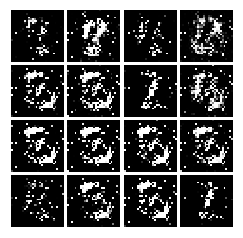

Epoch: 9, Iter: 4560, D: 1.308, G:1.148


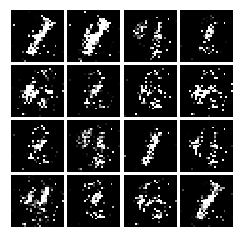

Epoch: 9, Iter: 4580, D: 1.383, G:0.7895


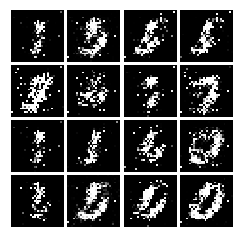

Epoch: 9, Iter: 4600, D: 1.429, G:0.7722


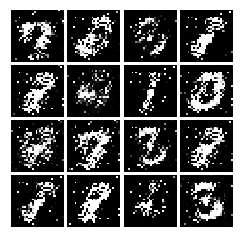

Epoch: 9, Iter: 4620, D: 1.403, G:0.7314


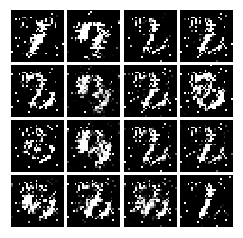

Epoch: 9, Iter: 4640, D: 1.324, G:0.9517


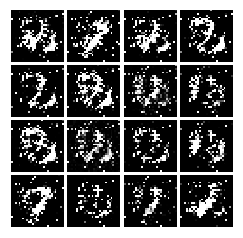

Epoch: 9, Iter: 4660, D: 1.313, G:1.037


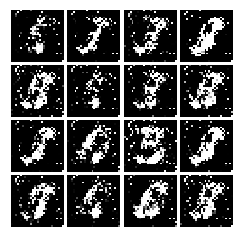

Epoch: 9, Iter: 4680, D: 1.333, G:0.9021


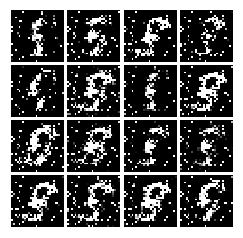

Final images


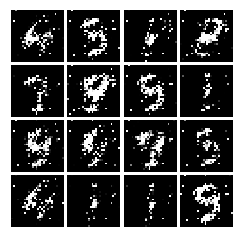

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [32]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    l_real = 0.5 * tf.reduce_mean(tf.pow(scores_real - 1.0, 2))
    l_fake = 0.5 * tf.reduce_mean(tf.pow(scores_fake, 2))
    loss = l_real + l_fake

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.pow(scores_fake - 1.0, 2))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [33]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2032, G:0.2077


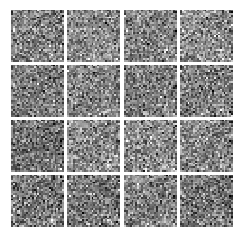

Epoch: 0, Iter: 20, D: 1.757, G:0.5172


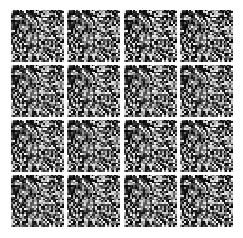

Epoch: 0, Iter: 40, D: 0.09512, G:0.5161


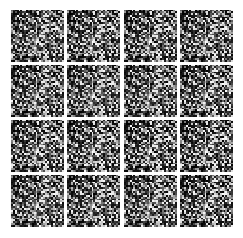

Epoch: 0, Iter: 60, D: 0.01953, G:0.5051


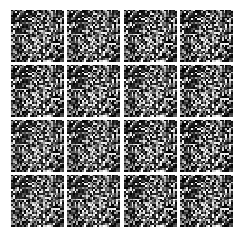

Epoch: 0, Iter: 80, D: 0.03485, G:0.506


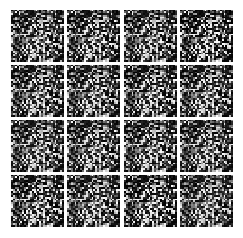

Epoch: 0, Iter: 100, D: 0.02063, G:0.4788


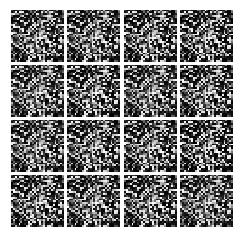

Epoch: 0, Iter: 120, D: 0.1227, G:0.5054


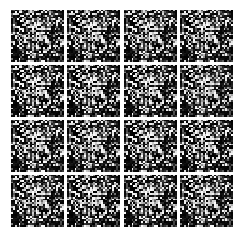

Epoch: 0, Iter: 140, D: 0.03287, G:0.5148


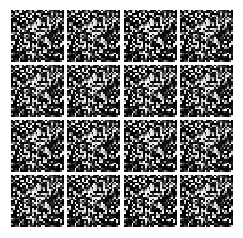

Epoch: 0, Iter: 160, D: 0.004937, G:0.5073


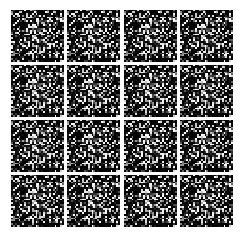

Epoch: 0, Iter: 180, D: 0.02267, G:0.5174


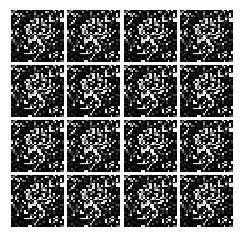

Epoch: 0, Iter: 200, D: 0.2435, G:0.2636


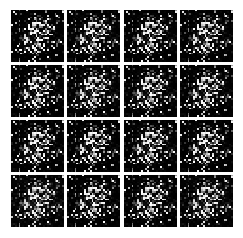

Epoch: 0, Iter: 220, D: 0.3303, G:0.2648


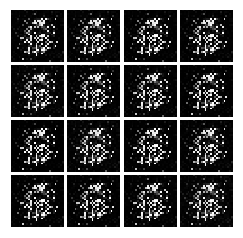

Epoch: 0, Iter: 240, D: 0.008501, G:0.502


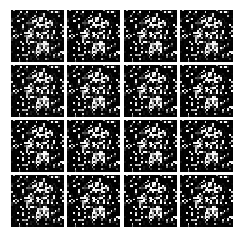

Epoch: 0, Iter: 260, D: 0.0442, G:0.5078


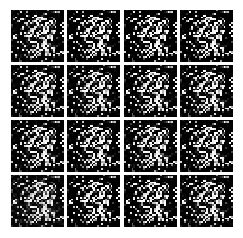

Epoch: 0, Iter: 280, D: 0.007142, G:0.5065


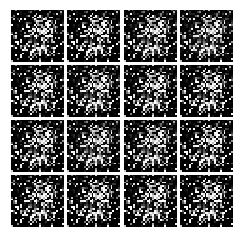

Epoch: 0, Iter: 300, D: 0.2282, G:0.494


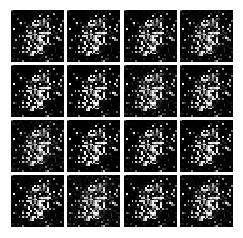

Epoch: 0, Iter: 320, D: 0.1874, G:0.5036


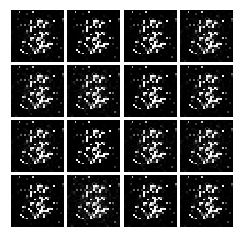

Epoch: 0, Iter: 340, D: 0.05195, G:0.5168


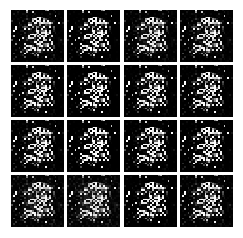

Epoch: 0, Iter: 360, D: 0.1426, G:0.18


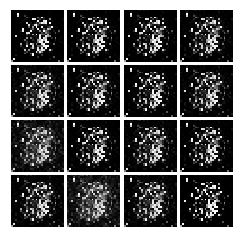

Epoch: 0, Iter: 380, D: 0.1023, G:0.2438


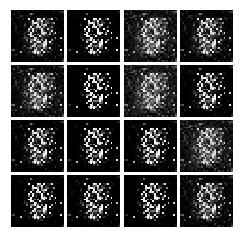

Epoch: 0, Iter: 400, D: 0.1861, G:0.4845


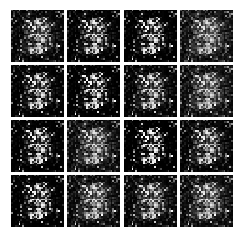

Epoch: 0, Iter: 420, D: 0.1462, G:0.4946


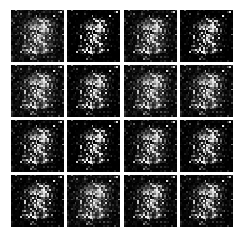

Epoch: 0, Iter: 440, D: 0.1994, G:0.5017


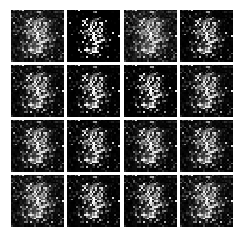

Epoch: 0, Iter: 460, D: 0.1483, G:0.4985


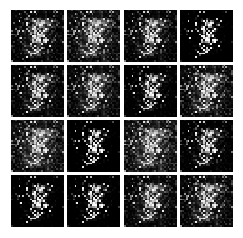

Epoch: 1, Iter: 480, D: 0.2007, G:0.3784


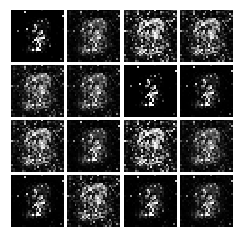

Epoch: 1, Iter: 500, D: 0.141, G:0.3413


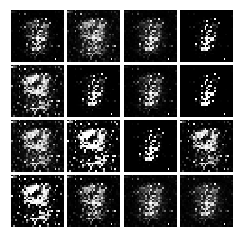

Epoch: 1, Iter: 520, D: 0.1854, G:0.5022


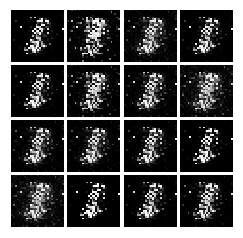

Epoch: 1, Iter: 540, D: 0.3839, G:0.5023


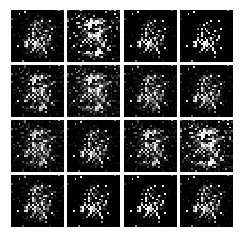

Epoch: 1, Iter: 560, D: 0.05434, G:0.5017


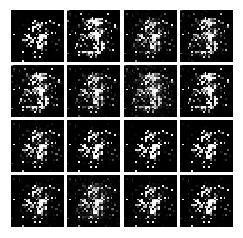

Epoch: 1, Iter: 580, D: 0.1029, G:0.503


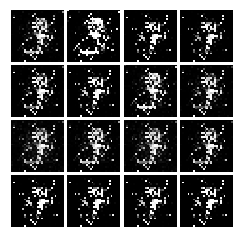

Epoch: 1, Iter: 600, D: 0.04123, G:0.5009


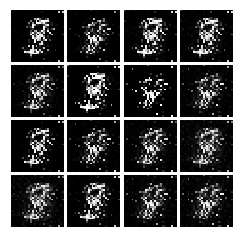

Epoch: 1, Iter: 620, D: 0.09769, G:0.5012


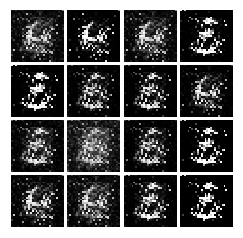

Epoch: 1, Iter: 640, D: 0.08107, G:0.4392


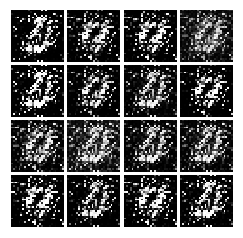

Epoch: 1, Iter: 660, D: 0.189, G:0.2544


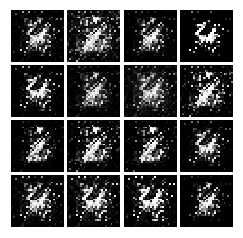

Epoch: 1, Iter: 680, D: 0.1025, G:0.4643


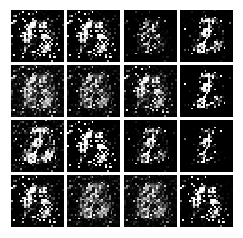

Epoch: 1, Iter: 700, D: 0.1314, G:0.4739


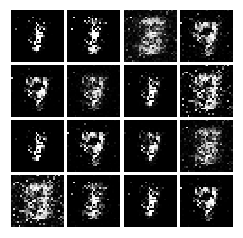

Epoch: 1, Iter: 720, D: 0.07982, G:0.4909


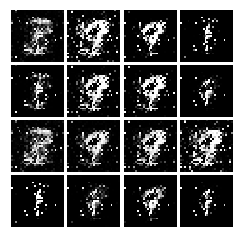

Epoch: 1, Iter: 740, D: 0.1306, G:0.4863


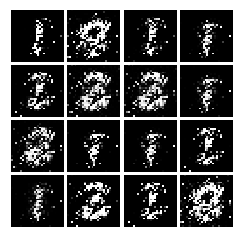

Epoch: 1, Iter: 760, D: 0.06442, G:0.5021


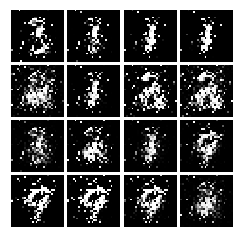

Epoch: 1, Iter: 780, D: 0.1554, G:0.4526


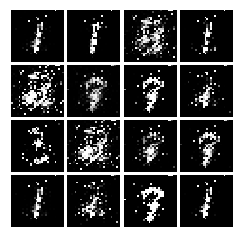

Epoch: 1, Iter: 800, D: 0.1068, G:0.4791


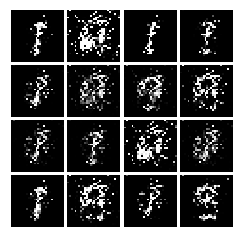

Epoch: 1, Iter: 820, D: 0.2143, G:0.4775


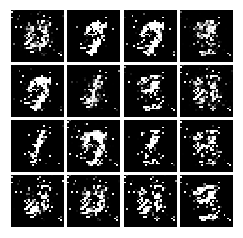

Epoch: 1, Iter: 840, D: 0.03507, G:0.504


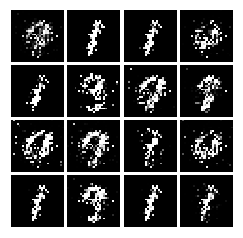

Epoch: 1, Iter: 860, D: 0.07616, G:0.5036


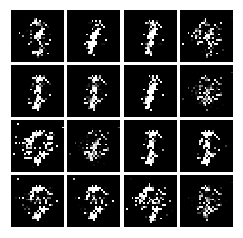

Epoch: 1, Iter: 880, D: 0.06713, G:0.5009


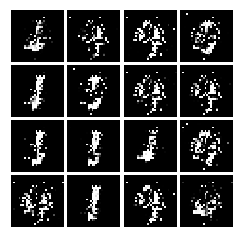

Epoch: 1, Iter: 900, D: 0.117, G:0.4367


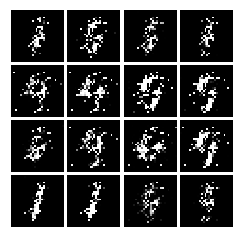

Epoch: 1, Iter: 920, D: 0.0411, G:0.5009


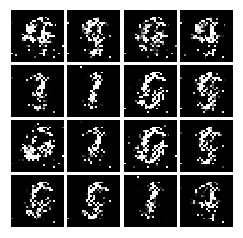

Epoch: 2, Iter: 940, D: 0.128, G:0.3143


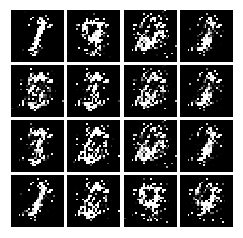

Epoch: 2, Iter: 960, D: 0.1013, G:0.4032


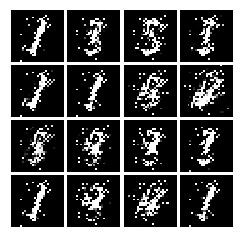

Epoch: 2, Iter: 980, D: 0.05342, G:0.3721


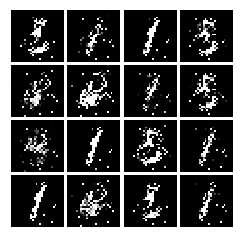

Epoch: 2, Iter: 1000, D: 0.1117, G:0.4318


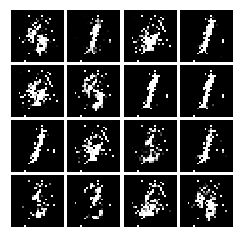

Epoch: 2, Iter: 1020, D: 0.05705, G:0.3612


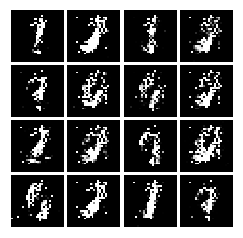

Epoch: 2, Iter: 1040, D: 0.1011, G:0.2534


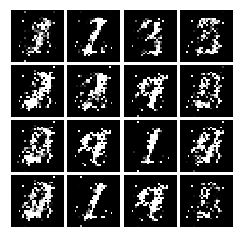

Epoch: 2, Iter: 1060, D: 0.135, G:0.3255


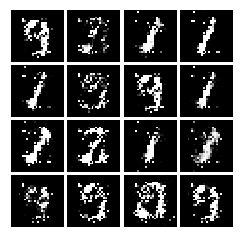

Epoch: 2, Iter: 1080, D: 0.05004, G:0.4047


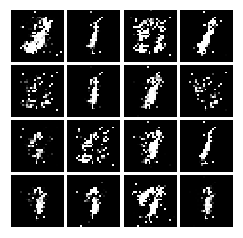

Epoch: 2, Iter: 1100, D: 0.08897, G:0.3367


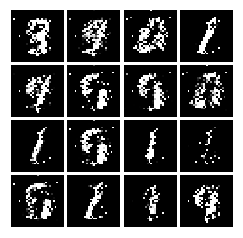

Epoch: 2, Iter: 1120, D: 0.05444, G:0.4181


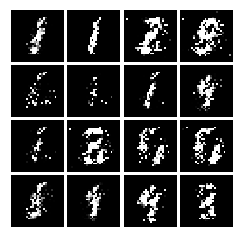

Epoch: 2, Iter: 1140, D: 0.1132, G:0.4876


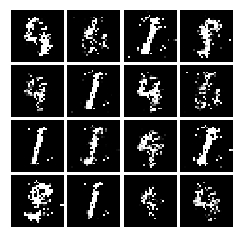

Epoch: 2, Iter: 1160, D: 0.1275, G:0.4314


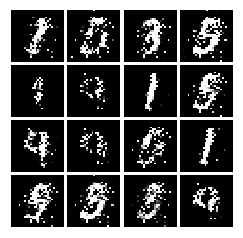

Epoch: 2, Iter: 1180, D: 0.0761, G:0.1734


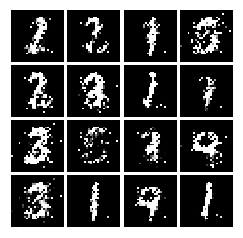

Epoch: 2, Iter: 1200, D: 0.0614, G:0.2706


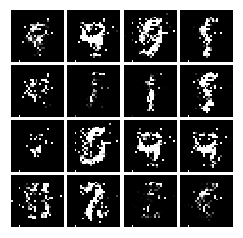

Epoch: 2, Iter: 1220, D: 0.1419, G:0.4928


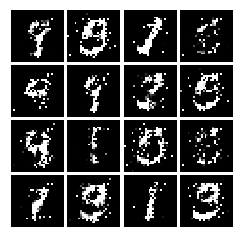

Epoch: 2, Iter: 1240, D: 0.08173, G:0.4788


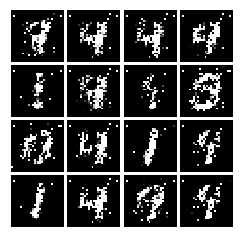

Epoch: 2, Iter: 1260, D: 0.07683, G:0.4693


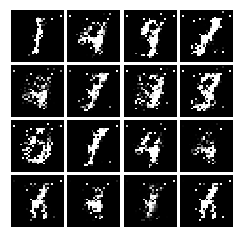

Epoch: 2, Iter: 1280, D: 0.07546, G:0.4243


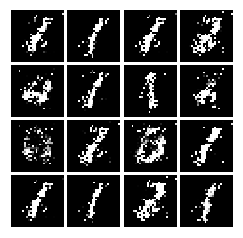

Epoch: 2, Iter: 1300, D: 0.1015, G:0.4891


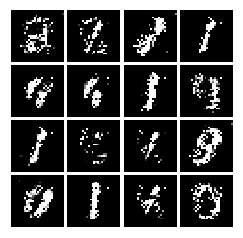

Epoch: 2, Iter: 1320, D: 0.09408, G:0.3449


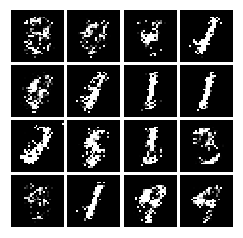

Epoch: 2, Iter: 1340, D: 0.07521, G:0.3331


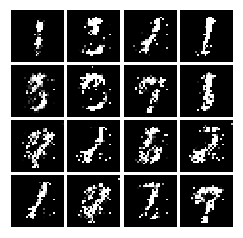

Epoch: 2, Iter: 1360, D: 0.1948, G:0.2676


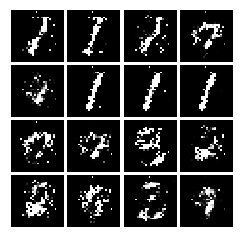

Epoch: 2, Iter: 1380, D: 0.2003, G:0.3384


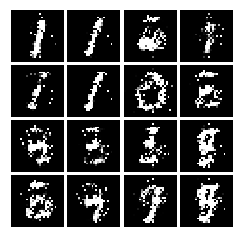

Epoch: 2, Iter: 1400, D: 0.07276, G:0.4355


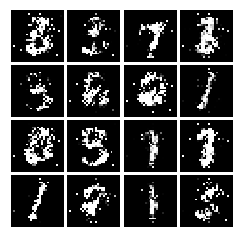

Epoch: 3, Iter: 1420, D: 0.1095, G:0.3472


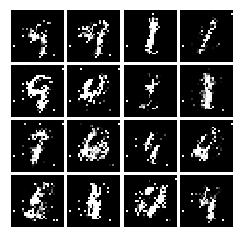

Epoch: 3, Iter: 1440, D: 0.1181, G:0.4402


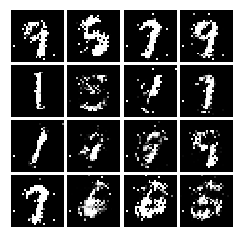

Epoch: 3, Iter: 1460, D: 0.1583, G:0.4161


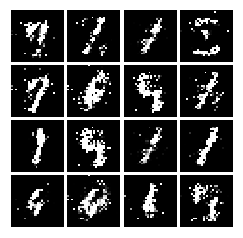

Epoch: 3, Iter: 1480, D: 0.1139, G:0.3942


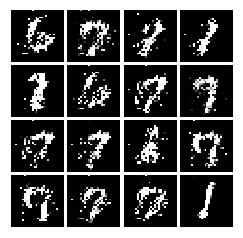

Epoch: 3, Iter: 1500, D: 0.1711, G:0.2547


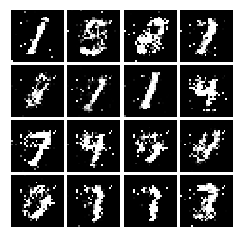

Epoch: 3, Iter: 1520, D: 0.1453, G:0.285


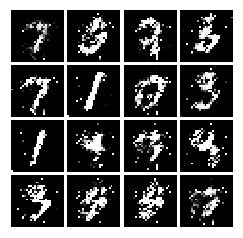

Epoch: 3, Iter: 1540, D: 0.2146, G:0.4554


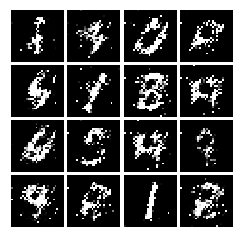

Epoch: 3, Iter: 1560, D: 0.09764, G:0.357


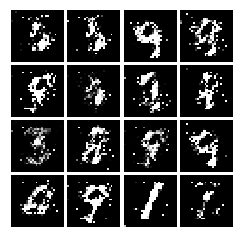

Epoch: 3, Iter: 1580, D: 0.1428, G:0.1605


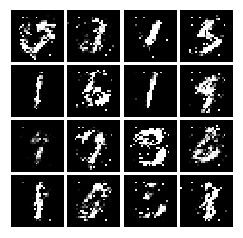

Epoch: 3, Iter: 1600, D: 0.1658, G:0.4393


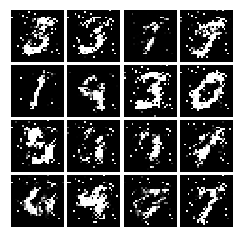

Epoch: 3, Iter: 1620, D: 0.1849, G:0.4332


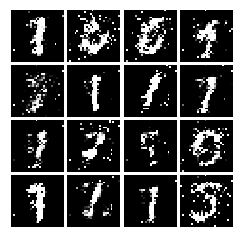

Epoch: 3, Iter: 1640, D: 0.2218, G:0.1023


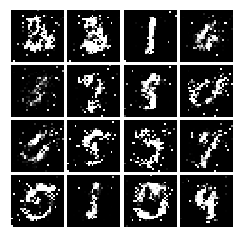

Epoch: 3, Iter: 1660, D: 0.1919, G:0.2246


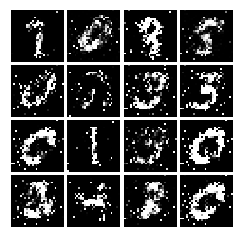

Epoch: 3, Iter: 1680, D: 0.2635, G:0.2367


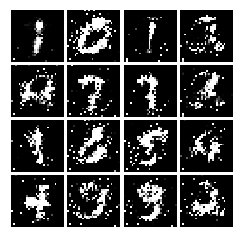

Epoch: 3, Iter: 1700, D: 0.1504, G:0.3725


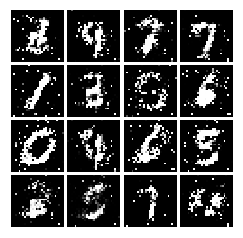

Epoch: 3, Iter: 1720, D: 0.2384, G:0.1895


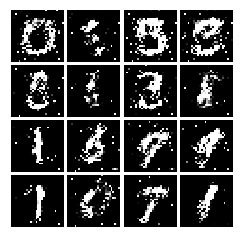

Epoch: 3, Iter: 1740, D: 0.159, G:0.2844


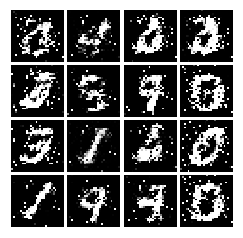

Epoch: 3, Iter: 1760, D: 0.1373, G:0.3216


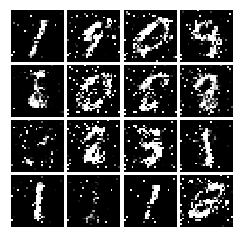

Epoch: 3, Iter: 1780, D: 0.1651, G:0.3769


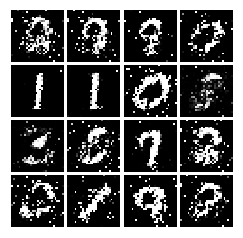

Epoch: 3, Iter: 1800, D: 0.1962, G:0.2125


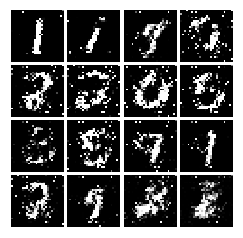

Epoch: 3, Iter: 1820, D: 0.2212, G:0.1595


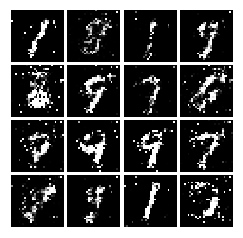

Epoch: 3, Iter: 1840, D: 0.1643, G:0.1413


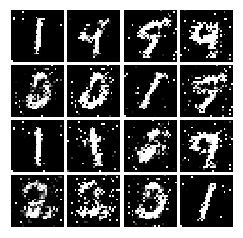

Epoch: 3, Iter: 1860, D: 0.1956, G:0.2301


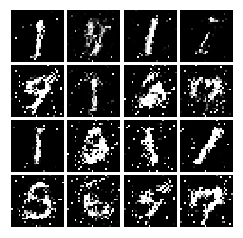

Epoch: 4, Iter: 1880, D: 0.1711, G:0.1751


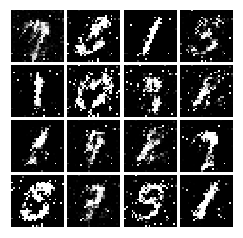

Epoch: 4, Iter: 1900, D: 0.1782, G:0.1629


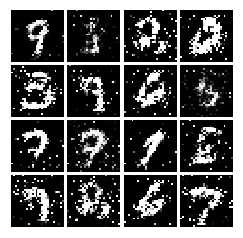

Epoch: 4, Iter: 1920, D: 0.2111, G:0.1546


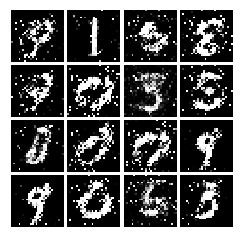

Epoch: 4, Iter: 1940, D: 0.2056, G:0.2263


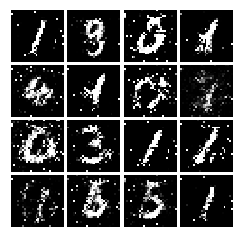

Epoch: 4, Iter: 1960, D: 0.1851, G:0.3251


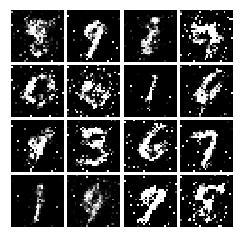

Epoch: 4, Iter: 1980, D: 0.1767, G:0.2952


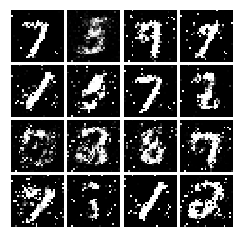

Epoch: 4, Iter: 2000, D: 0.194, G:0.2024


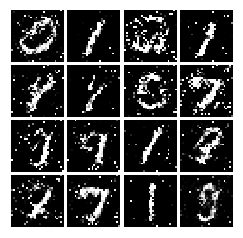

Epoch: 4, Iter: 2020, D: 0.1919, G:0.2477


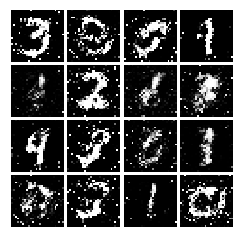

Epoch: 4, Iter: 2040, D: 0.232, G:0.3045


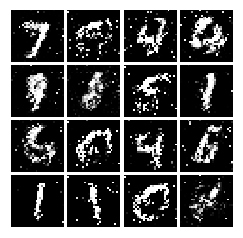

Epoch: 4, Iter: 2060, D: 0.1777, G:0.2048


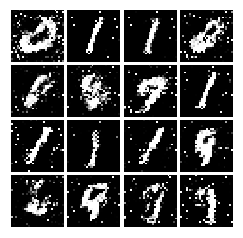

Epoch: 4, Iter: 2080, D: 0.1856, G:0.2408


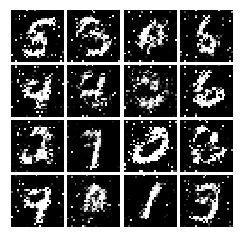

Epoch: 4, Iter: 2100, D: 0.2004, G:0.264


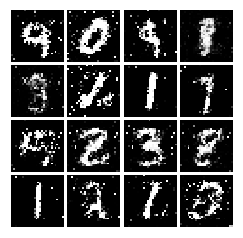

Epoch: 4, Iter: 2120, D: 0.2005, G:0.2063


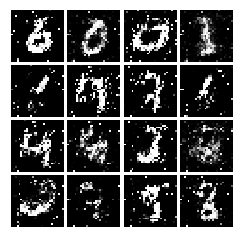

Epoch: 4, Iter: 2140, D: 0.1558, G:0.23


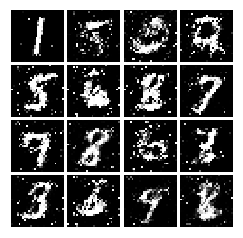

Epoch: 4, Iter: 2160, D: 0.2261, G:0.2154


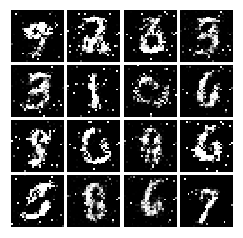

Epoch: 4, Iter: 2180, D: 0.1906, G:0.1731


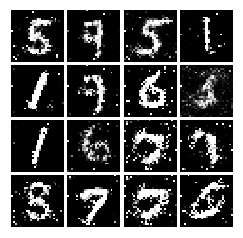

Epoch: 4, Iter: 2200, D: 0.1863, G:0.2261


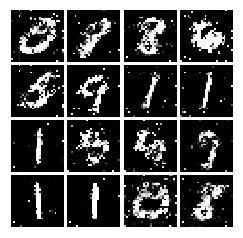

Epoch: 4, Iter: 2220, D: 0.1968, G:0.1659


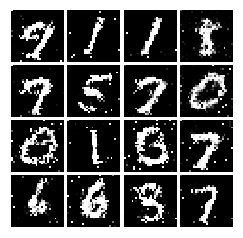

Epoch: 4, Iter: 2240, D: 0.1994, G:0.3115


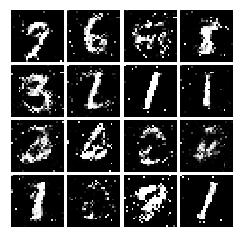

Epoch: 4, Iter: 2260, D: 0.1997, G:0.1686


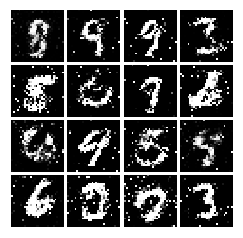

Epoch: 4, Iter: 2280, D: 0.1799, G:0.1566


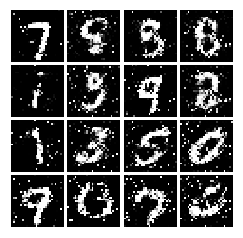

Epoch: 4, Iter: 2300, D: 0.1893, G:0.1724


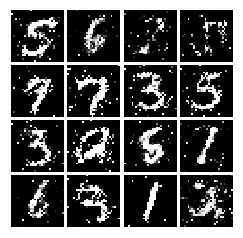

Epoch: 4, Iter: 2320, D: 0.1694, G:0.231


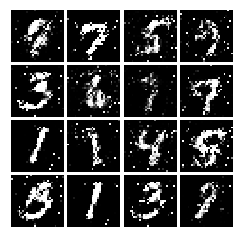

Epoch: 4, Iter: 2340, D: 0.1707, G:0.28


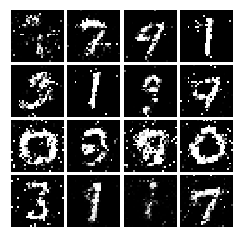

Epoch: 5, Iter: 2360, D: 0.1942, G:0.3538


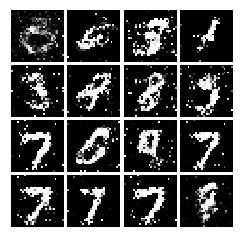

Epoch: 5, Iter: 2380, D: 0.1864, G:0.2371


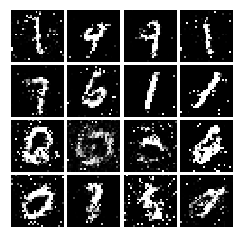

Epoch: 5, Iter: 2400, D: 0.2039, G:0.273


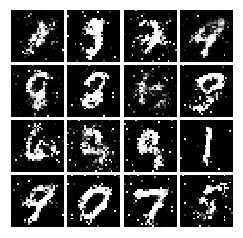

Epoch: 5, Iter: 2420, D: 0.1885, G:0.2238


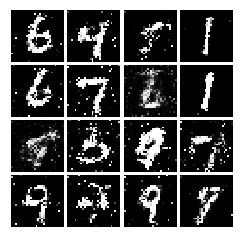

Epoch: 5, Iter: 2440, D: 0.1768, G:0.2406


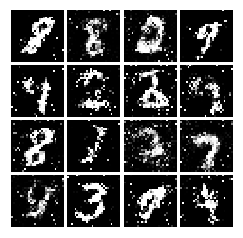

Epoch: 5, Iter: 2460, D: 0.1449, G:0.193


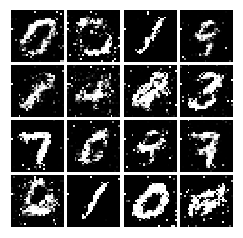

Epoch: 5, Iter: 2480, D: 0.1902, G:0.1976


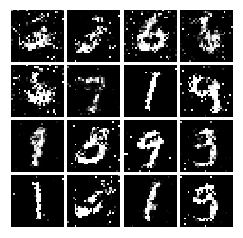

Epoch: 5, Iter: 2500, D: 0.1846, G:0.2613


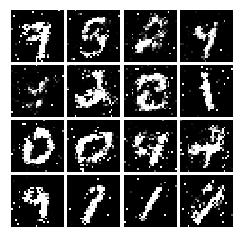

Epoch: 5, Iter: 2520, D: 0.1973, G:0.2963


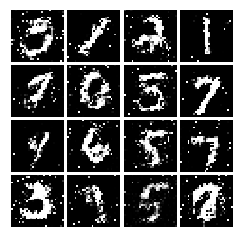

Epoch: 5, Iter: 2540, D: 0.1904, G:0.2558


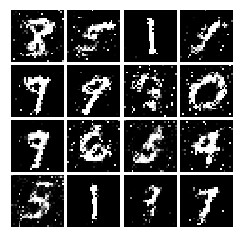

Epoch: 5, Iter: 2560, D: 0.2837, G:0.1354


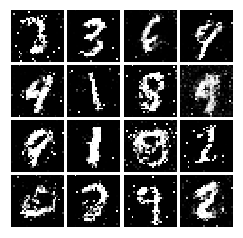

Epoch: 5, Iter: 2580, D: 0.2029, G:0.3485


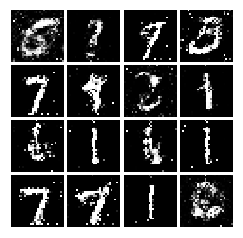

Epoch: 5, Iter: 2600, D: 0.1991, G:0.1696


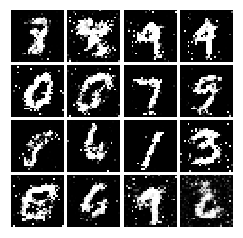

Epoch: 5, Iter: 2620, D: 0.194, G:0.2006


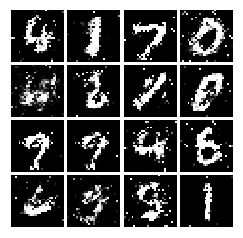

Epoch: 5, Iter: 2640, D: 0.2247, G:0.4088


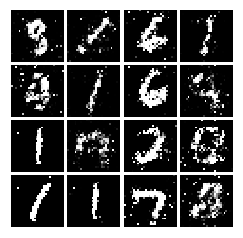

Epoch: 5, Iter: 2660, D: 0.1931, G:0.2781


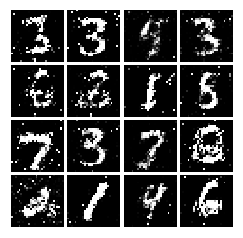

Epoch: 5, Iter: 2680, D: 0.2141, G:0.1965


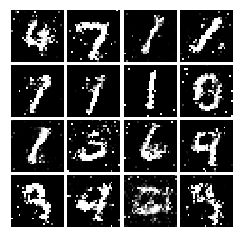

Epoch: 5, Iter: 2700, D: 0.2001, G:0.2131


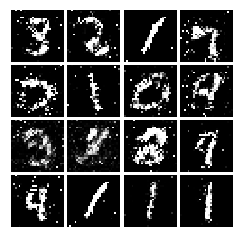

Epoch: 5, Iter: 2720, D: 0.2029, G:0.1726


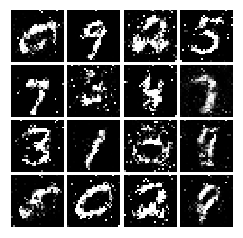

Epoch: 5, Iter: 2740, D: 0.2354, G:0.3018


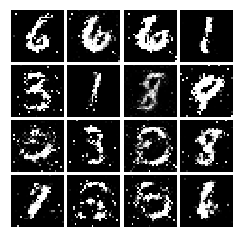

Epoch: 5, Iter: 2760, D: 0.2039, G:0.1461


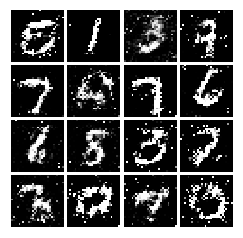

Epoch: 5, Iter: 2780, D: 0.2142, G:0.1509


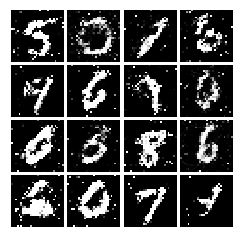

Epoch: 5, Iter: 2800, D: 0.1914, G:0.1987


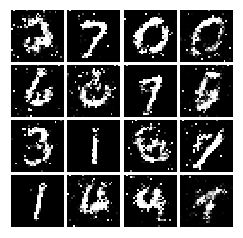

Epoch: 6, Iter: 2820, D: 0.2055, G:0.1909


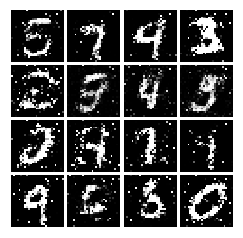

Epoch: 6, Iter: 2840, D: 0.2849, G:0.1533


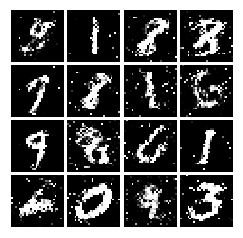

Epoch: 6, Iter: 2860, D: 0.1719, G:0.259


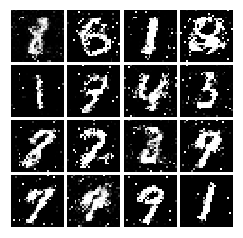

Epoch: 6, Iter: 2880, D: 0.1698, G:0.1963


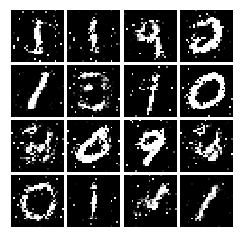

Epoch: 6, Iter: 2900, D: 0.1898, G:0.2523


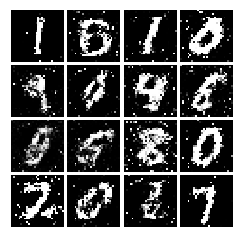

Epoch: 6, Iter: 2920, D: 0.1983, G:0.1733


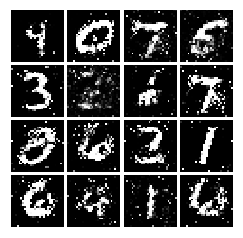

Epoch: 6, Iter: 2940, D: 0.2537, G:0.1521


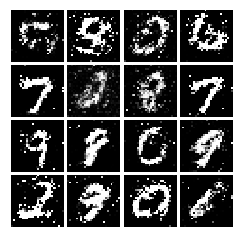

Epoch: 6, Iter: 2960, D: 0.1995, G:0.249


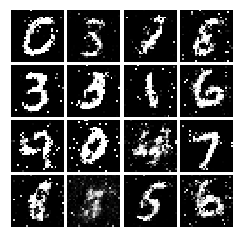

Epoch: 6, Iter: 2980, D: 0.2243, G:0.146


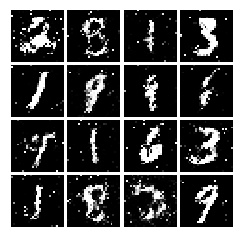

Epoch: 6, Iter: 3000, D: 0.2117, G:0.1173


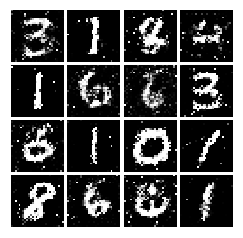

Epoch: 6, Iter: 3020, D: 0.219, G:0.1648


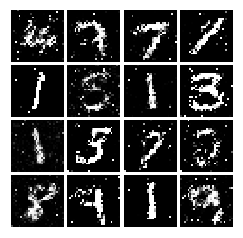

Epoch: 6, Iter: 3040, D: 0.1928, G:0.167


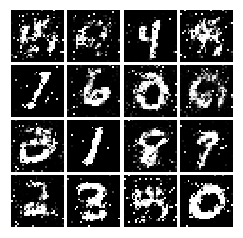

Epoch: 6, Iter: 3060, D: 0.1971, G:0.1457


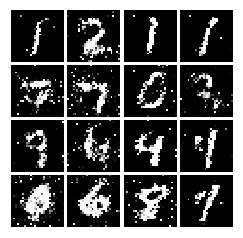

Epoch: 6, Iter: 3080, D: 0.182, G:0.2128


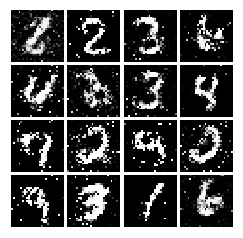

Epoch: 6, Iter: 3100, D: 0.1938, G:0.1885


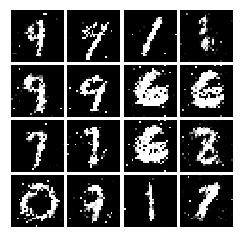

Epoch: 6, Iter: 3120, D: 0.1766, G:0.2078


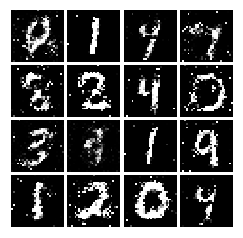

Epoch: 6, Iter: 3140, D: 0.1976, G:0.2092


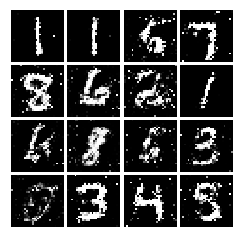

Epoch: 6, Iter: 3160, D: 0.1953, G:0.2944


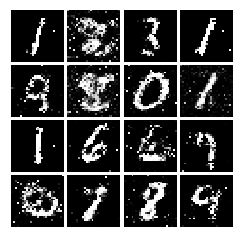

Epoch: 6, Iter: 3180, D: 0.184, G:0.2135


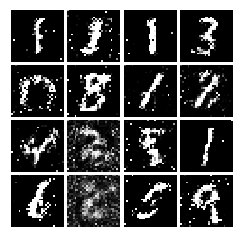

Epoch: 6, Iter: 3200, D: 0.1969, G:0.2885


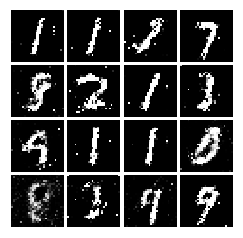

Epoch: 6, Iter: 3220, D: 0.2097, G:0.2856


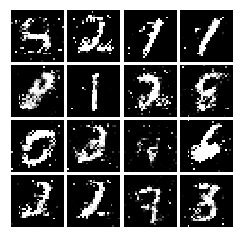

Epoch: 6, Iter: 3240, D: 0.1877, G:0.1632


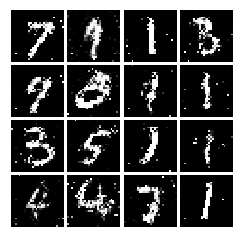

Epoch: 6, Iter: 3260, D: 0.201, G:0.2543


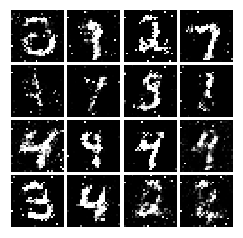

Epoch: 6, Iter: 3280, D: 0.208, G:0.1956


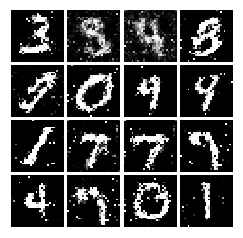

Epoch: 7, Iter: 3300, D: 0.2023, G:0.1802


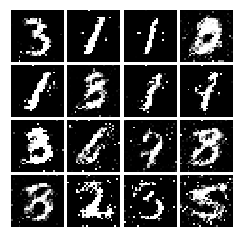

Epoch: 7, Iter: 3320, D: 0.2088, G:0.1567


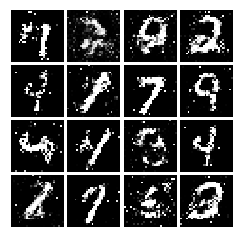

Epoch: 7, Iter: 3340, D: 0.1862, G:0.2868


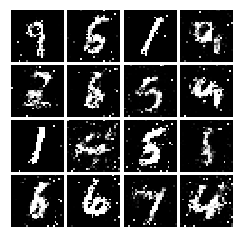

Epoch: 7, Iter: 3360, D: 0.2185, G:0.1588


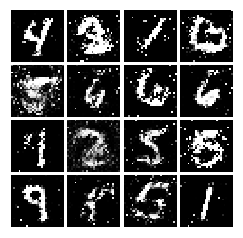

Epoch: 7, Iter: 3380, D: 0.1865, G:0.1908


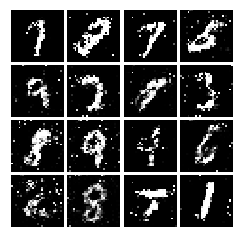

Epoch: 7, Iter: 3400, D: 0.2237, G:0.1596


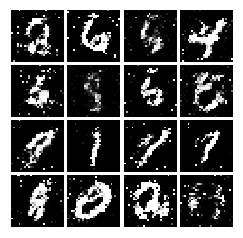

Epoch: 7, Iter: 3420, D: 0.1995, G:0.2135


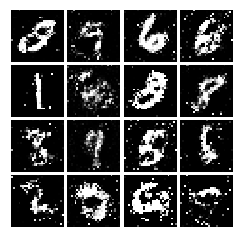

Epoch: 7, Iter: 3440, D: 0.2168, G:0.3245


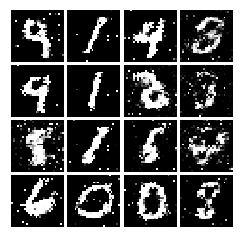

Epoch: 7, Iter: 3460, D: 0.2084, G:0.2694


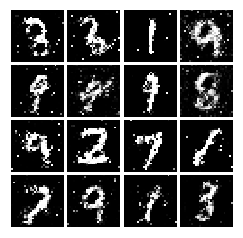

Epoch: 7, Iter: 3480, D: 0.2287, G:0.1202


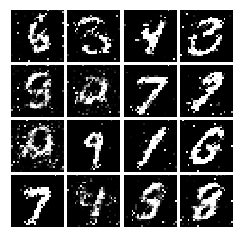

Epoch: 7, Iter: 3500, D: 0.2016, G:0.2886


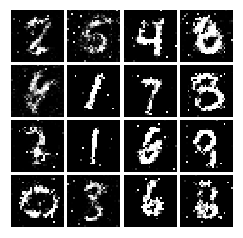

Epoch: 7, Iter: 3520, D: 0.2046, G:0.1675


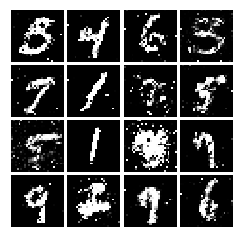

Epoch: 7, Iter: 3540, D: 0.1778, G:0.2011


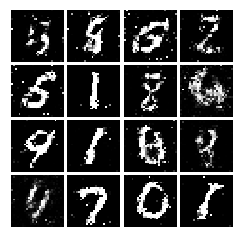

Epoch: 7, Iter: 3560, D: 0.1947, G:0.2492


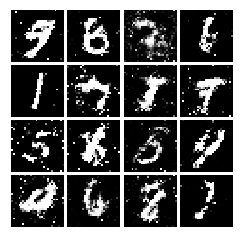

Epoch: 7, Iter: 3580, D: 0.1982, G:0.1873


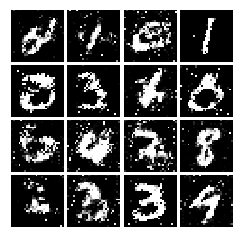

Epoch: 7, Iter: 3600, D: 0.1987, G:0.1972


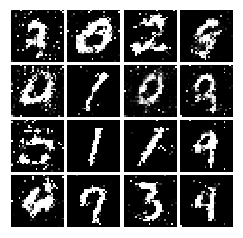

Epoch: 7, Iter: 3620, D: 0.2433, G:0.1259


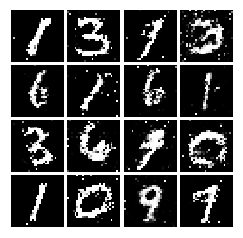

Epoch: 7, Iter: 3640, D: 0.2275, G:0.2586


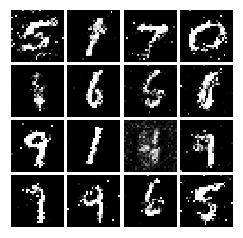

Epoch: 7, Iter: 3660, D: 0.2054, G:0.2295


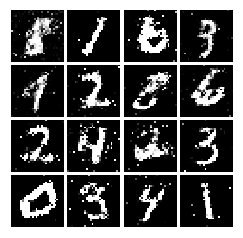

Epoch: 7, Iter: 3680, D: 0.2096, G:0.2445


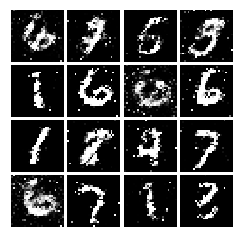

Epoch: 7, Iter: 3700, D: 0.2106, G:0.2361


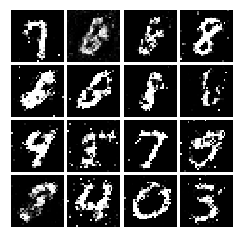

Epoch: 7, Iter: 3720, D: 0.2118, G:0.2047


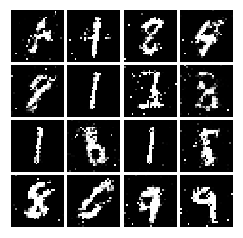

Epoch: 7, Iter: 3740, D: 0.2278, G:0.1559


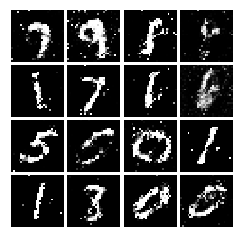

Epoch: 8, Iter: 3760, D: 0.2071, G:0.2324


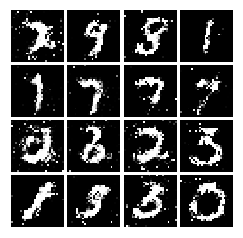

Epoch: 8, Iter: 3780, D: 0.2028, G:0.2034


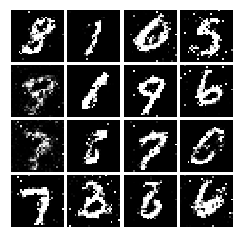

Epoch: 8, Iter: 3800, D: 0.188, G:0.2255


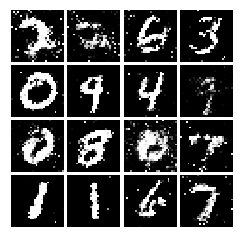

Epoch: 8, Iter: 3820, D: 0.2415, G:0.2607


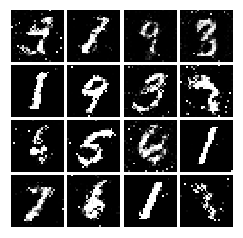

Epoch: 8, Iter: 3840, D: 0.2109, G:0.2051


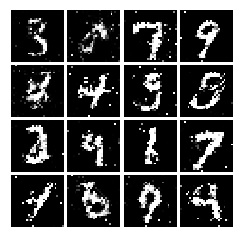

Epoch: 8, Iter: 3860, D: 0.1994, G:0.2097


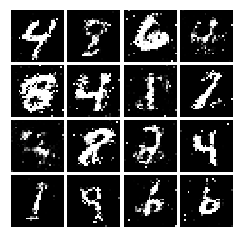

Epoch: 8, Iter: 3880, D: 0.2333, G:0.1691


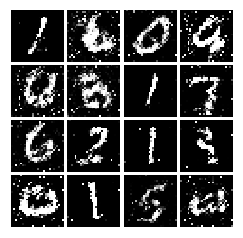

Epoch: 8, Iter: 3900, D: 0.2251, G:0.2012


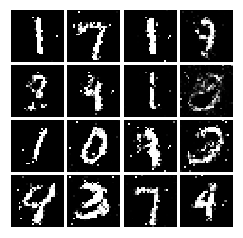

Epoch: 8, Iter: 3920, D: 0.2037, G:0.1373


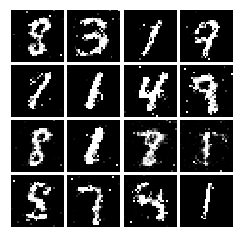

Epoch: 8, Iter: 3940, D: 0.2317, G:0.1538


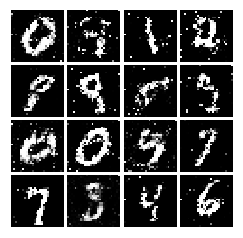

Epoch: 8, Iter: 3960, D: 0.2243, G:0.27


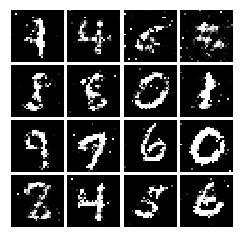

Epoch: 8, Iter: 3980, D: 0.2039, G:0.1987


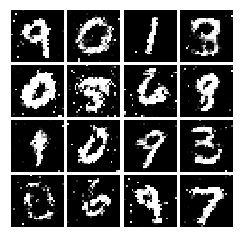

Epoch: 8, Iter: 4000, D: 0.2216, G:0.1192


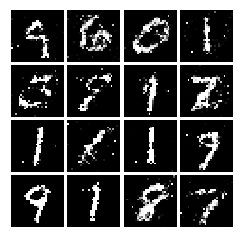

Epoch: 8, Iter: 4020, D: 0.2142, G:0.1823


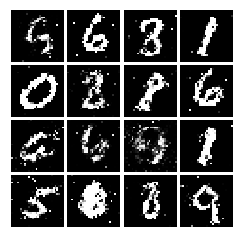

Epoch: 8, Iter: 4040, D: 0.2468, G:0.2349


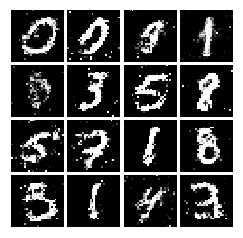

Epoch: 8, Iter: 4060, D: 0.2103, G:0.2207


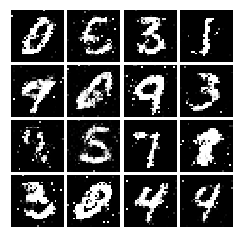

Epoch: 8, Iter: 4080, D: 0.2567, G:0.1583


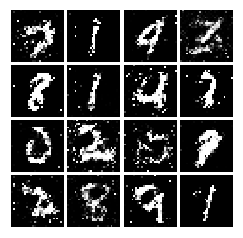

Epoch: 8, Iter: 4100, D: 0.2344, G:0.123


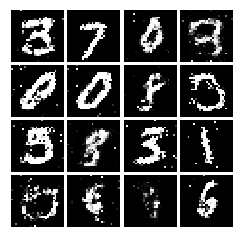

Epoch: 8, Iter: 4120, D: 0.2116, G:0.2302


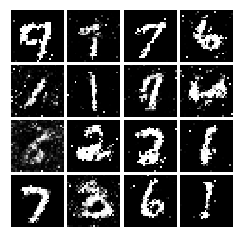

Epoch: 8, Iter: 4140, D: 0.2324, G:0.1718


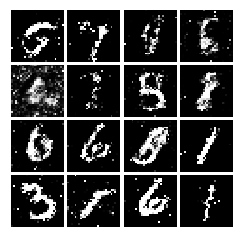

Epoch: 8, Iter: 4160, D: 0.2832, G:0.09947


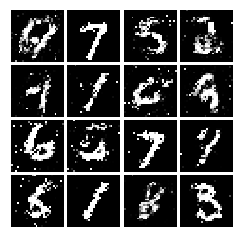

Epoch: 8, Iter: 4180, D: 0.2284, G:0.2152


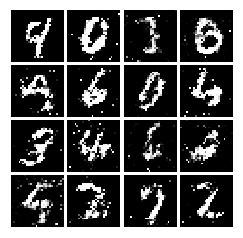

Epoch: 8, Iter: 4200, D: 0.1951, G:0.1861


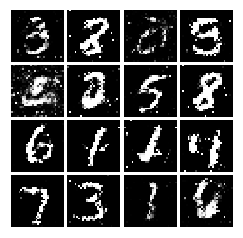

Epoch: 8, Iter: 4220, D: 0.1963, G:0.1776


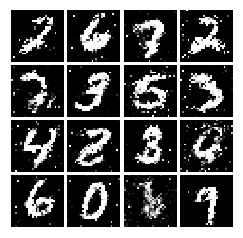

Epoch: 9, Iter: 4240, D: 0.2152, G:0.2072


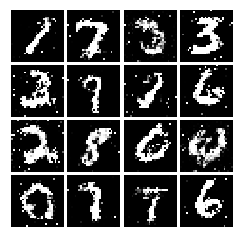

Epoch: 9, Iter: 4260, D: 0.2353, G:0.144


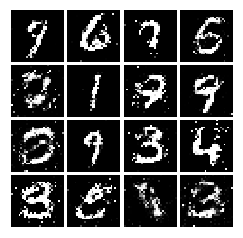

Epoch: 9, Iter: 4280, D: 0.2111, G:0.1768


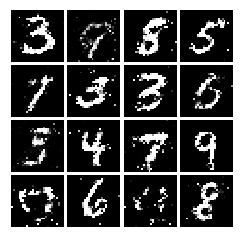

Epoch: 9, Iter: 4300, D: 0.2314, G:0.1589


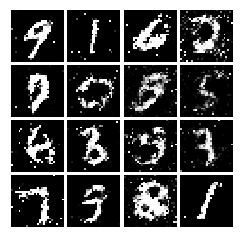

Epoch: 9, Iter: 4320, D: 0.2219, G:0.2167


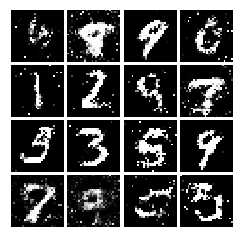

Epoch: 9, Iter: 4340, D: 0.2014, G:0.1941


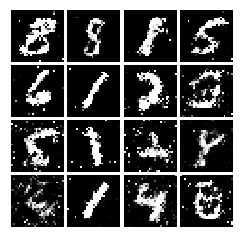

Epoch: 9, Iter: 4360, D: 0.2128, G:0.2701


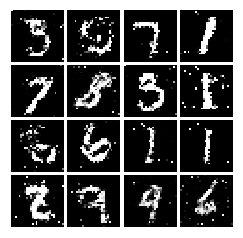

Epoch: 9, Iter: 4380, D: 0.2206, G:0.1978


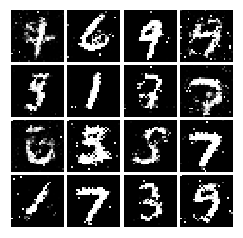

Epoch: 9, Iter: 4400, D: 0.2391, G:0.159


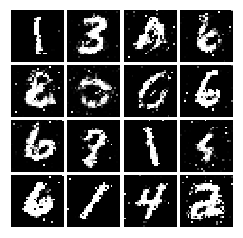

Epoch: 9, Iter: 4420, D: 0.2044, G:0.2111


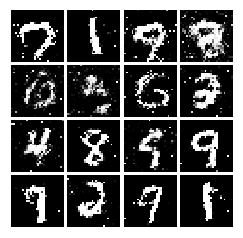

Epoch: 9, Iter: 4440, D: 0.2257, G:0.2364


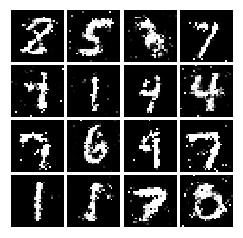

Epoch: 9, Iter: 4460, D: 0.2254, G:0.168


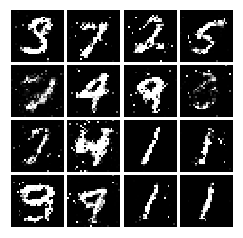

Epoch: 9, Iter: 4480, D: 0.191, G:0.2252


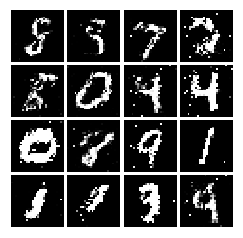

Epoch: 9, Iter: 4500, D: 0.2371, G:0.1401


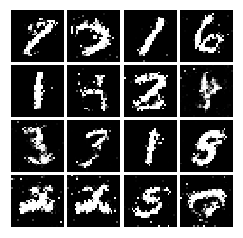

Epoch: 9, Iter: 4520, D: 0.2219, G:0.2018


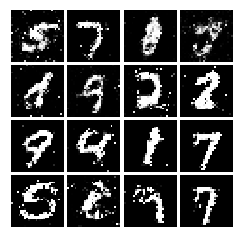

Epoch: 9, Iter: 4540, D: 0.2204, G:0.1761


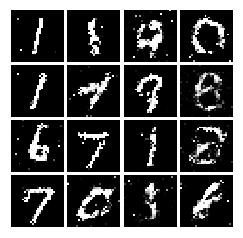

Epoch: 9, Iter: 4560, D: 0.2162, G:0.2122


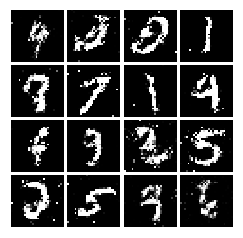

Epoch: 9, Iter: 4580, D: 0.1994, G:0.4109


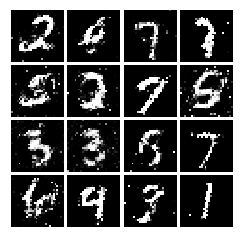

Epoch: 9, Iter: 4600, D: 0.2283, G:0.1888


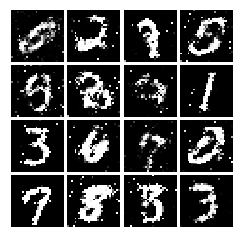

Epoch: 9, Iter: 4620, D: 0.2095, G:0.1716


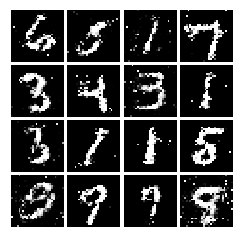

Epoch: 9, Iter: 4640, D: 0.2117, G:0.264


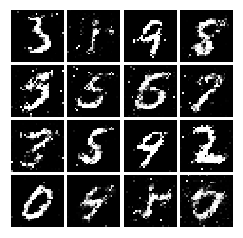

Epoch: 9, Iter: 4660, D: 0.2338, G:0.1545


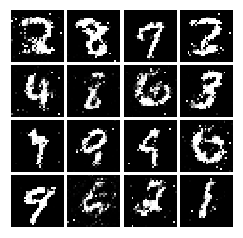

Epoch: 9, Iter: 4680, D: 0.215, G:0.156


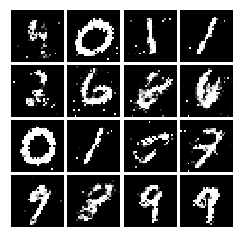

Final images


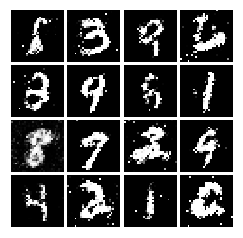

In [26]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [13]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1), input_shape=(128, 784)),
        tf.keras.layers.Conv2D(
            filters=32, kernel_size=5, strides=1, padding='VALID', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
        tf.keras.layers.Conv2D(
            filters=64, kernel_size=5, strides=1, padding='VALID', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, activation=leaky_relu),
        tf.keras.layers.Dense(1, use_bias=True)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [14]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation=tf.nn.relu, use_bias=True),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7 * 7 * 128, activation=tf.nn.relu, use_bias=True),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape(target_shape=(7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(
            filters=64, kernel_size=4, strides=2, padding='SAME', activation=tf.nn.relu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(
            filters=1, kernel_size=4, strides=2, padding='SAME', activation=tf.nn.tanh)
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.369, G:0.6619


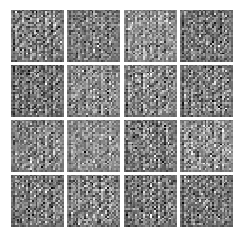

Epoch: 0, Iter: 100, D: 0.4241, G:2.599


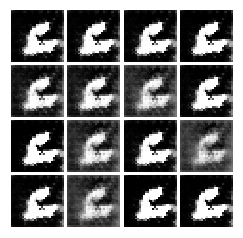

Epoch: 0, Iter: 200, D: 0.6289, G:2.989


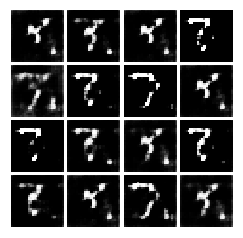

Epoch: 0, Iter: 300, D: 0.3573, G:3.678


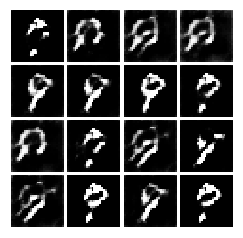

Epoch: 0, Iter: 400, D: 0.8341, G:3.416


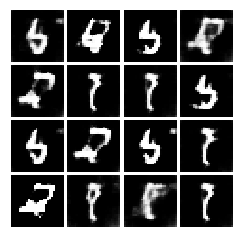

Epoch: 1, Iter: 500, D: 0.4014, G:3.377


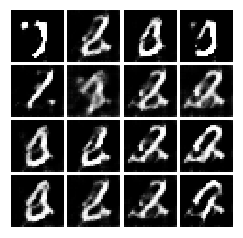

Epoch: 1, Iter: 600, D: 0.519, G:1.727


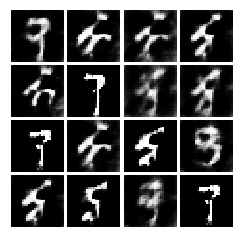

Epoch: 1, Iter: 700, D: 0.3976, G:4.369


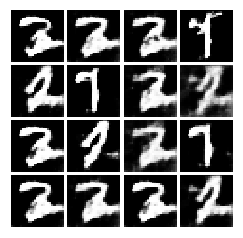

Epoch: 1, Iter: 800, D: 0.2461, G:3.824


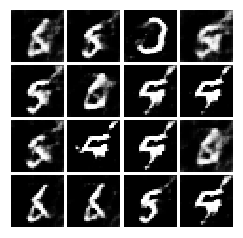

Epoch: 1, Iter: 900, D: 0.577, G:3.677


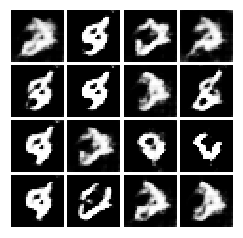

Epoch: 2, Iter: 1000, D: 0.7332, G:2.897


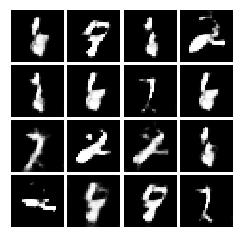

Epoch: 2, Iter: 1100, D: 0.5777, G:2.245


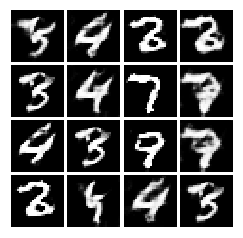

Epoch: 2, Iter: 1200, D: 0.4691, G:3.341


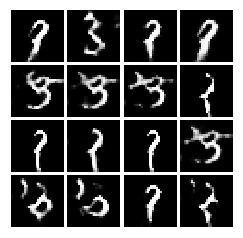

Epoch: 2, Iter: 1300, D: 0.4025, G:3.179


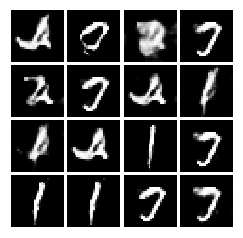

Epoch: 2, Iter: 1400, D: 0.5673, G:2.173


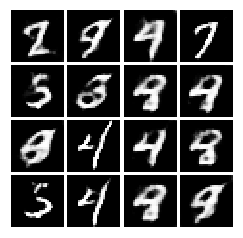

Epoch: 3, Iter: 1500, D: 0.5365, G:3.407


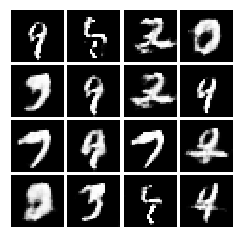

Epoch: 3, Iter: 1600, D: 0.463, G:2.248


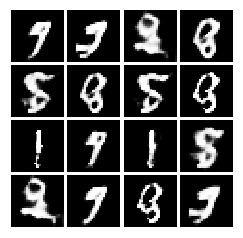

Epoch: 3, Iter: 1700, D: 0.3627, G:2.927


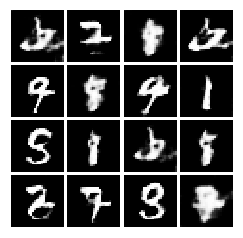

Epoch: 3, Iter: 1800, D: 0.3172, G:3.419


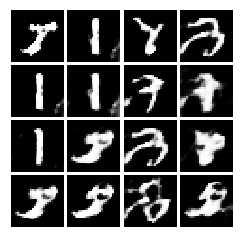

Epoch: 4, Iter: 1900, D: 0.3088, G:2.864


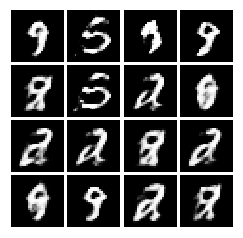

Epoch: 4, Iter: 2000, D: 0.3245, G:3.492


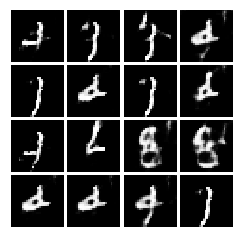

Epoch: 4, Iter: 2100, D: 0.1246, G:5.107


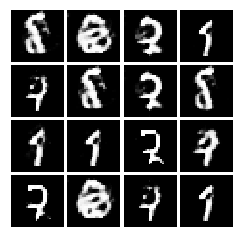

Epoch: 4, Iter: 2200, D: 0.2162, G:4.066


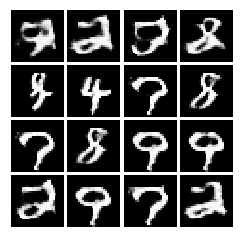

Epoch: 4, Iter: 2300, D: 0.3668, G:2.754


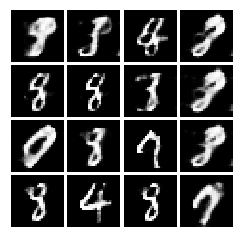

Final images


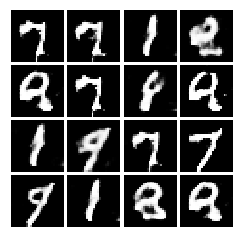

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5, show_every=100, print_every=100)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
$\min_x\max_y f(x,y)$ evaluates to 0, as setting x to zero will not allow function to get higher value, even with large positive or negative y.<br>
$$\frac{df}{dx}=y$$
$$\frac{df}{dy}=x$$
$$y_{t+1} = y_t + x_t \cdot 1 \textrm{ (maximazing, gradient ascend)}$$
$$x_{t+1}=x_t-y_{t+1} \cdot 1 \textrm{ (minimazing, gradient descend)}$$
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |  1    | -1    |  -2   |  -1   |   1   
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   | -2    | -1    |   1   |   2   |   1    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer:
This method, with such parameters, will never reach the optimal value 0, as it will just repeat the cycle starting and ending with (1, 1)


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
Generator loss decreases when it manages to create images that discriminator takes for real. However, the high value of discriminator loss means that it does not cope with its task and doesn't distinguish real and fake images well. So, it is likely that generator is fooling discriminator not by creating realistic images, but rather using flaws in discriminator's recognition process. 